# REFMAP laboratory listening test 1 analysis: Sound quality analysis

## Setup

In [ ]:
# -*- coding: utf-8 -*-
import sys
import os
# Build a path from the notebook's parent directory to the python modules
module_path = os.path.abspath(os.path.join('..'))

# Add to sys.path if not already present
if module_path not in sys.path:
    sys.path.append(module_path)

# import statements
import numpy as np
import pandas as pd
from PyQt5.QtWidgets import QFileDialog, QApplication
from scipy import stats
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import pingouin as pg
from cycler import cycler
from refmap_psychoacoustics.utils.format_helpers import (round_trad, display_round)
from refmap_psychoacoustics.utils.plotting_helpers import spiderplot

# enable copy-on-write mode for Pandas (will be default from Pandas 3.0)
pd.options.mode.copy_on_write = True

In [2]:
# set plot parameters
sns.set_style('white')
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'Times New Roman'
mpl.rcParams.update({'font.size': 16})
mpl.rcParams['figure.autolayout'] = True
mpl.rcParams['mathtext.fontset'] = 'stix'

SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE,
       labelsize=MEDIUM_SIZE)    # fontsize of the axes title and x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

mycolours = [(0, 102, 255), (0, 204, 153), (255, 0, 102), (74, 111, 152),
             (251, 164, 49), (204, 153, 255), (90, 192, 255), (80, 245, 233),
             (255, 90, 192), (164, 201, 242), (255, 254, 139), (255, 243, 255)]
mycolours = [tuple(shade/255 for shade in colour) for colour in mycolours]

# enable copy-on-write mode for Pandas (will be default from Pandas 3.0)
pd.options.mode.copy_on_write = True

# check/open QApplication instance
if not QApplication.instance():
    app = QApplication(sys.argv)
else:
    app = QApplication.instance() 

# set numpy seed
np.random.seed(808)

# setup ipython autoreloading magic
%load_ext autoreload
%autoreload 2


Set the saveplots toggle to True if plot saving is desired:

In [3]:
saveplots = True

if saveplots:
    # select figure output save path
    outFigPath = QFileDialog.getExistingDirectory(caption=r"Select output folder to save plots '03 Experiment\Experiment 1\Analysis\Plots'")

    # create subfolders if not already existing
    try:
        os.mkdir(os.path.join(outFigPath, "svg"))
    except FileExistsError:
        pass

    try:
        os.mkdir(os.path.join(outFigPath, "pdf"))
    except FileExistsError:
        pass


Set the savedata toggle to True if data saving is desired:

In [4]:
savedata = True

if savedata:
    # select data output save path
    outDataPath = QFileDialog.getExistingDirectory(caption=r"Select output folder to save data '03 Experiment\Experiment 1\Analysis\Python'")


## Import data and organise

In [5]:
# import test data
fileExts = "*.csv"

# Part A
dataByStimAFilePath = list(QFileDialog.getOpenFileName(filter="refmap_listest1_testdataA_ByStim.csv",
                                                       caption=r"Open refmap_listest1_testdataA_ByStim.csv in: '03 Experiment\Experiment 1\Analysis\PostProcess'"))[0]
dataByStimTestA = pd.read_csv(dataByStimAFilePath, index_col=0)

dataByStimANoticeFilePath = list(QFileDialog.getOpenFileName(filter="refmap_listest1_testdataANoticeFilt_ByStim.csv",
                                                             caption=r"Open refmap_listest1_testdataANoticeFilt_ByStim.csv in: '03 Experiment\Experiment 1\Analysis\PostProcess'"))[0]
dataByStimTestANotice = pd.read_csv(dataByStimANoticeFilePath, index_col=0)

# Part B
dataByStimBFilePath = list(QFileDialog.getOpenFileName(filter="refmap_listest1_testdataB_ByStim.csv",
                                                       caption=r"Open refmap_listest1_testdataB_ByStim.csv in: '03 Experiment\Experiment 1\Analysis\PostProcess'"))[0]
dataByStimTestB = pd.read_csv(dataByStimBFilePath, index_col=0)

# Parts A and B

dataByStimFilePath = list(QFileDialog.getOpenFileName(filter="refmap_listest1_testdata_ByStim.csv",
                                                      caption=r"Open refmap_listest1_testdata_ByStim.csv in: '03 Experiment\Experiment 1\Analysis\PostProcess'"))[0]
dataByStimTest = pd.read_csv(dataByStimFilePath, index_col=0)


# Auxiliary data

auxDataByStimFilePath = list(QFileDialog.getOpenFileName(filter="refmap_listest1_auxdata.csv",
                                                         caption=r"Open refmap_listest1_auxdata.csv in: '03 Experiment\Experiment 1\Analysis\PostProcess'"))[0]
auxData =  pd.read_csv(auxDataByStimFilePath, index_col=0)
auxData.drop(index='G57_background', inplace=True)

## Data manipulation

In [6]:
# categorise columns

for dataset in [dataByStimTestA, dataByStimTestANotice, dataByStimTest]:
    # insert "Baseline" value into missing values for the SNRlevel, UASLAeq, UASOperation and UASType columns
    dataset['SNRlevel'] = dataset['SNRlevel'].fillna("Baseline")
    dataset['UASLAeq'] = dataset['UASLAeq'].fillna("Baseline")
    dataset['UASOperation'] = dataset['UASOperation'].fillna("Baseline")
    dataset['UASType'] = dataset['UASType'].fillna("Baseline")

    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["Baseline", "-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["Baseline", "42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Baseline", "Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["Baseline", "H520", "M300", "T150"], ordered=True)

for dataset in [dataByStimTestB]:
    # insert "Baseline" value into missing values for the SNRlevel, UASLAeq, UASOperation and UASType columns
    dataset['SNRlevel'] = dataset['SNRlevel'].fillna("Baseline")
    dataset['UASLAeq'] = dataset['UASLAeq'].fillna("Baseline")
    dataset['UASOperation'] = dataset['UASOperation'].fillna("Baseline")
    dataset['UASType'] = dataset['UASType'].fillna("Baseline")

    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["Baseline", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["Baseline", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Baseline", "Overflight"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["Baseline", "H520", "T150"], ordered=True)

for dataset in [auxData]:
    # ensure 'UASLAeq' field is parsed as categorical with correct order
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'].astype(int).astype(str), ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)


DON'T RUN THE NEXT BLOCK UNLESS NEEDING TIME-DEPENDENT DATA - EXCESSIVE LOADING TIME

In [ ]:
## !!!ONLY RUN IF NEEDED - TIME-INTENSIVE LOADING BLOCK!!!

# import SQM time-dependent data
fileExts = "*.xlsx"
filelist = list(QFileDialog.getOpenFileNames(filter=fileExts,
                                             caption=r"Select SQM analysis files in: \03 Experiment\Experiment 1\Analysis\ArtemiS\Output_new"))[0]
filelist.sort()
filenames = [filepath.split('/')[-1] for filepath in filelist]
A1_SQM = pd.read_excel(io=filelist[0], sheet_name=None)
A2_SQM = pd.read_excel(io=filelist[1], sheet_name=None)
H520_F_1_SQM = pd.read_excel(io=filelist[2], sheet_name=None)
H520_L_1_SQM = pd.read_excel(io=filelist[3], sheet_name=None)
H520_T_1_SQM = pd.read_excel(io=filelist[4], sheet_name=None)
M300_F_1_SQM = pd.read_excel(io=filelist[5], sheet_name=None)
M300_L_1_SQM = pd.read_excel(io=filelist[6], sheet_name=None)
M300_T_1_SQM = pd.read_excel(io=filelist[7], sheet_name=None)
T150_F_1_SQM = pd.read_excel(io=filelist[8], sheet_name=None)
T150_L_1_SQM = pd.read_excel(io=filelist[9], sheet_name=None)
T150_T_1_SQM = pd.read_excel(io=filelist[10], sheet_name=None)

## Functions

### Pearson r for pairwise plots

In [7]:
def corr_pearson(x, y, hue=None, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, p = stats.pearsonr(x, y)

    if r < 0:
        y = 0.2
    else:
        y = 0.9
    
    if p < 0.001:
        equals = ""
    else:
        equals = "= "

    ax = ax or plt.gca()
    ax.annotate(f'$r$ = {display_round(r, floor=False)}', xy=(.05, y),
                xycoords=ax.transAxes)
    ax.annotate(f'$p$ {equals}{display_round(p)}', xy=(.05, y - 0.075),
                xycoords=ax.transAxes)

## Stimuli sound quality analysis

### Time-aggregated

In [8]:
# prepare subdata frame 
df_SQM = auxData.loc[(auxData['UASLAeq'] == '60') &
                     (auxData['SessionPart'] == 'A'), ['UASType', 'UASOperation',
                              'LoudECMAPowAvgBin', 'SharpAurISO305ExMaxLR',
                              'TonalSHMInt05ExMaxLR', 'FluctECMA10ExBin',
                              'RoughFZ05ExMaxLR', 'ImpulsSHMAvgMaxLR']]

max_values = np.round(np.max(df_SQM.iloc[:, 2:], axis=0)*1.1, 3)


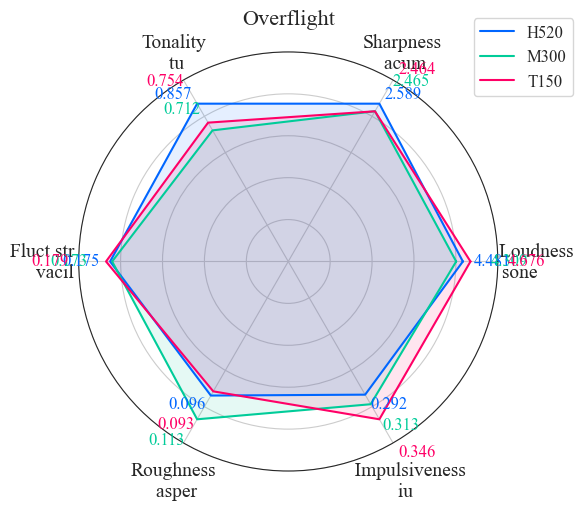

In [9]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[3]].values, 3),
        'Tonality\n tu\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsiveness\n iu': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[7]].values, 3)
    })

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Overflight", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMOverflight"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()


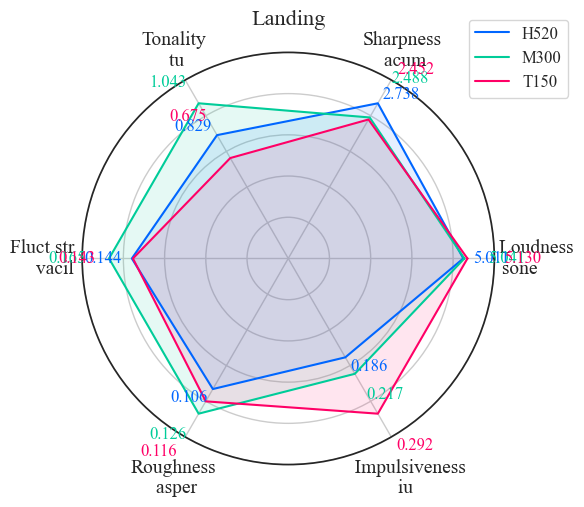

In [ ]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[3]].values, 3),
        'Tonality\n tu\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsiveness\n iu': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[7]].values, 3)
    })

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Landing", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMLanding"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()


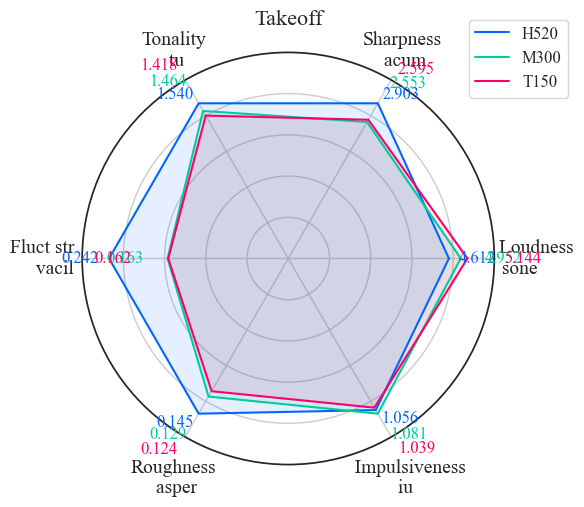

In [167]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[3]].values, 3),
        'Tonality\n tu\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsiveness\n iu': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[7]].values, 3)
    })

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Takeoff", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMTakeoff"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()

Radar analysis repeated with tonal loudness instead of (integrated) tonality and impulsive loudness instead of impulsivity

In [10]:
# prepare subdata frame 
df_SQM = auxData.loc[(auxData['UASLAeq'] == '60') &
                     (auxData['SessionPart'] == 'A'), ['UASType', 'UASOperation',
                              'LoudECMAPowAvgBin', 'SharpAurISO305ExMaxLR',
                              'TonLdECMAPowAvgBin', 'FluctECMA10ExBin',
                              'RoughFZ05ExMaxLR', 'ImpulsLoudWZAvgMaxLR']]

max_values = np.round(np.max(df_SQM.iloc[:, 2:], axis=0)*1.1, 3)


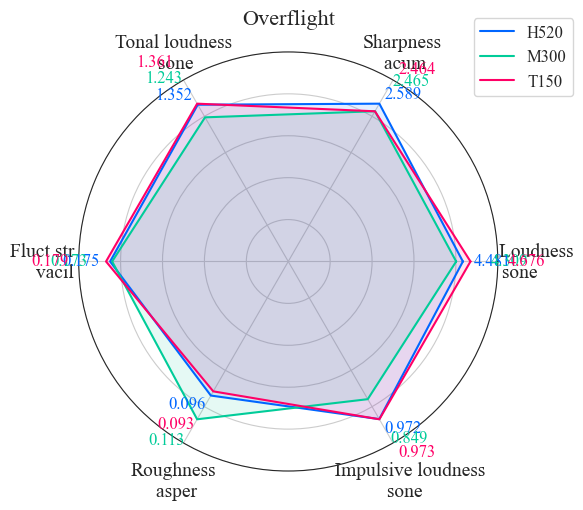

In [13]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[3]].values, 3),
        'Tonal loudness\n sone\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsive loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Overflight'), df_SQM.columns[7]].values, 3)
    })

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Overflight", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMOverflightLd"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()


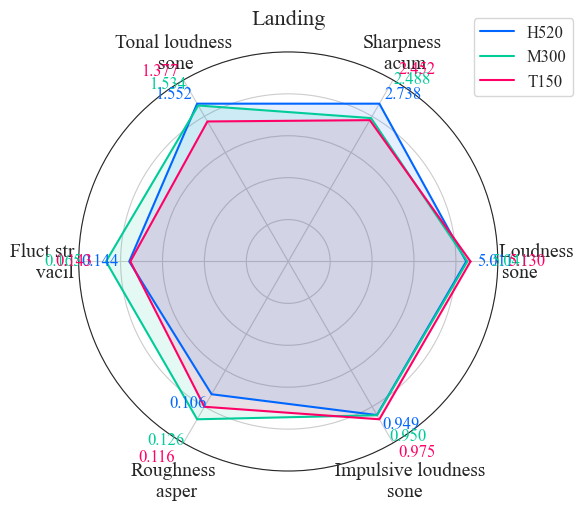

In [15]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[3]].values, 3),
        'Tonal loudness\n sone\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsive loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Landing'), df_SQM.columns[7]].values, 3)
    })

if saveplots:
    savefigpath = [os.path.join(outFigPath, "svg", "UASSQMLandingTLd.svg"),
                   os.path.join(outFigPath, "pdf", "UASSQMLandingTLd.pdf")]
else:
    savefigpath = False

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Landing", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMLandingLd"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()

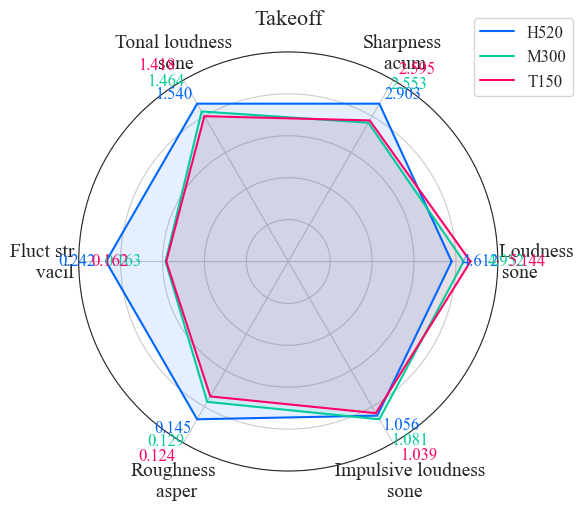

In [16]:
data=pd.DataFrame({
        'UASType': df_SQM['UASType'].unique(),
        '        Loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[2]].values, 3),
        'Sharpness\n acum\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[3]].values, 3),
        'Tonal loudness\n sone\n': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[4]].values, 3),
        'Fluct str       \n vacil   ': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[5]].values, 3),
        '\n\nRoughness\n asper': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[6]].values, 3),
        '\n\n   Impulsive loudness\n sone': np.round(df_SQM.loc[(df_SQM['UASOperation'] == 'Takeoff'), df_SQM.columns[7]].values, 3)
    })

fig, ax = plt.subplots(subplot_kw=dict(polar=True), figsize=(6, 6))

spiderplot(df=data, id_column='UASType', categories=None, ax=ax,
           title="Takeoff", limits=None, max_values=max_values,
           scalers=None, padding=1.15, annotate=True,
           offset=True, fmt='{:.3f}', labelsize=12,
           ticksize=14, legendsize=12, titlesize=16, palette=mycolours)

if saveplots:

    filename = "UASSQMTakeoffLd"

    fig.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg', bbox_inches='tight')
    fig.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf', bbox_inches='tight')

plt.show()

## Loudness/level comparison

In [10]:
def lowess_with_confidence_bounds(
    data, x, y, xvals=None, n_boot=1000, conf_interval=0.95, lowess_kw={}):
    """
    Perform Lowess regression and determine a confidence interval by bootstrap resampling
    """

    x = data[x]
    y = data[y]

    if xvals is None:
        xvals = x.sort_values().values
    
    # Lowess smoothing
    smoothed = sm.nonparametric.lowess(exog=x, endog=y, xvals=xvals, **lowess_kw)

    # Perform bootstrap resamplings of the data
    # and evaluate the smoothing at a fixed set of points
    smoothed_values = np.empty((n_boot, len(xvals)))
    for i in range(n_boot):
        sample = np.random.choice(len(x), len(x), replace=True)
        sampled_x = x.values[sample]
        sampled_y = y.values[sample]

        smoothed_values[i] = sm.nonparametric.lowess(
            exog=sampled_x, endog=sampled_y, xvals=xvals, **lowess_kw
        )

    # Get the confidence interval
    sorted_values = np.sort(smoothed_values, axis=0)
    bound = int(n_boot * (1 - conf_interval) / 2)
    bottom = sorted_values[bound - 1]
    top = sorted_values[-bound]

    return smoothed, bottom, top


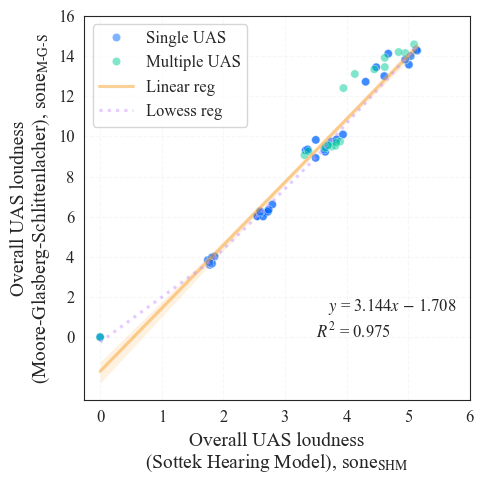

In [48]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudISO3PowAvgBin'], sm.add_constant(data['UASLoudECMAPowAvgBin']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLoudECMAPowAvgBin', y='UASLoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLoudECMAPowAvgBin', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLoudECMAPowAvgBin', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel="Overall UAS loudness" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       ylabel="Overall UAS loudness" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xticks=range(0, 7), yticks=range(0, 18, 2))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=3.5, y=0, s=r"$R^2$ = " + str(round(res.rsquared, 3)))
ax.text(x=3.5, y=1.3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" +" " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vNSHM"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

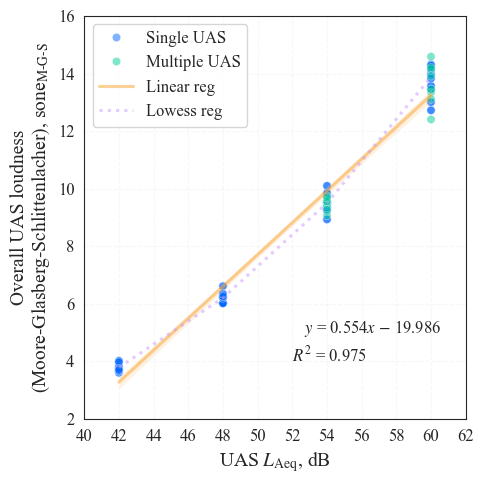

In [50]:
fig, ax = plt.subplots(figsize=(5, 5))

data = pd.concat([dataByStimTestA, dataByStimTestB])  # this is a fast way to strip the categories from the data frames when omitting the No UAS data for dB metrics
data = data[data['UASLAeq'] != "Baseline"]
data['UASLAeq'] = data['UASLAeq'].astype(float)

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudISO3PowAvgBin'], sm.add_constant(data['UASLAeq']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLAeq', y='UASLoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLAeq', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLAeq', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel=r"UAS $L_\text{Aeq}$, dB",
       ylabel="Overall UAS loudness" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xticks=range(40, 64, 2), yticks=range(2, 18, 2))
ax.text(x=52, y=4, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=52, y=5,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vLAeq"
    
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

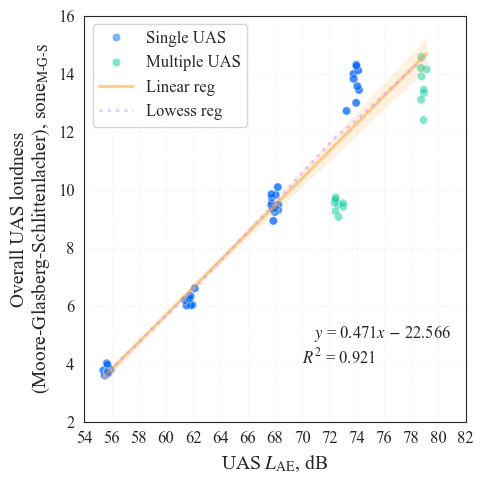

In [51]:
fig, ax = plt.subplots(figsize=(5, 5))

data = pd.concat([dataByStimTestA, dataByStimTestB])  # this is a fast way to strip the categories from the data frames
data = data[data['UASLAeq'] != "Baseline"]
data['UASLAeq'] = data['UASLAeq'].astype(float)

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudISO3PowAvgBin'], sm.add_constant(data['UASLAEMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLAEMaxLR', y='UASLoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLAEMaxLR', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLAEMaxLR', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel=r"UAS $L_\text{AE}$, dB",
       ylabel="Overall UAS loudness" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xticks=range(54, 84, 2), yticks=range(2, 18, 2))
ax.text(x=70, y=4, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=70, y=4.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vLAE"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

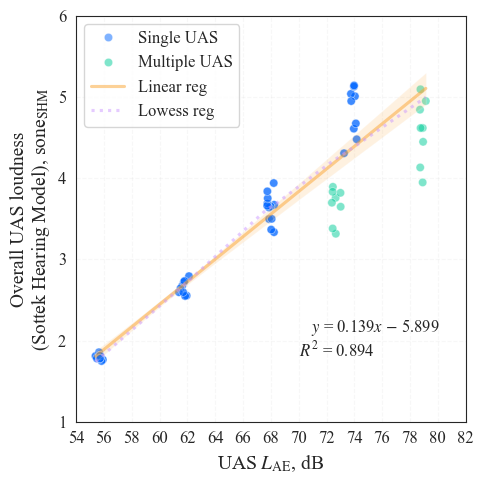

In [19]:
fig, ax = plt.subplots(figsize=(5, 5))

data = pd.concat([dataByStimTestA, dataByStimTestB])  # this is a fast way to strip the categories from the data frames when omitting the No UAS data for dB metrics
data = data[data['UASLAeq'] != "Baseline"]
data['UASLAeq'] = data['UASLAeq'].astype(float)

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudECMAPowAvgBin'], sm.add_constant(data['UASLAEMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLAEMaxLR', y='UASLoudECMAPowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLAEMaxLR', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLAEMaxLR', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')

ax.set(xlabel=r"UAS $L_\text{AE}$, dB",
       ylabel="Overall UAS loudness" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xticks=range(54, 84, 2), yticks=range(1, 7))
ax.text(x=70, y=1.8, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=70, y=2.1,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvLAE"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

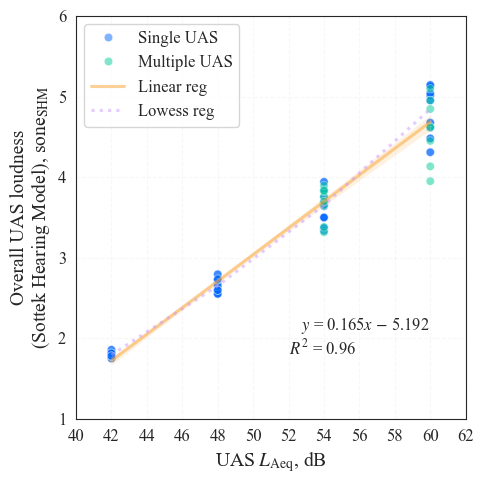

In [20]:
fig, ax = plt.subplots(figsize=(5, 5))

data = pd.concat([dataByStimTestA, dataByStimTestB])  # this is a fast way to strip the categories from the data frames when omitting the No UAS data for dB metrics
data = data[data['UASLAeq'] != "Baseline"]
data['UASLAeq'] = data['UASLAeq'].astype(float)

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudECMAPowAvgBin'], sm.add_constant(data['UASLAeq']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLAeq', y='UASLoudECMAPowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLAeq', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLAeq', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')

ax.set(xlabel=r"UAS $L_\text{Aeq}$, dB",
       ylabel="Overall UAS loudness"+ "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xticks=range(40, 64, 2), yticks=range(1, 7))
ax.text(x=52, y=1.8, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=52, y=2.1,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvLAeq"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

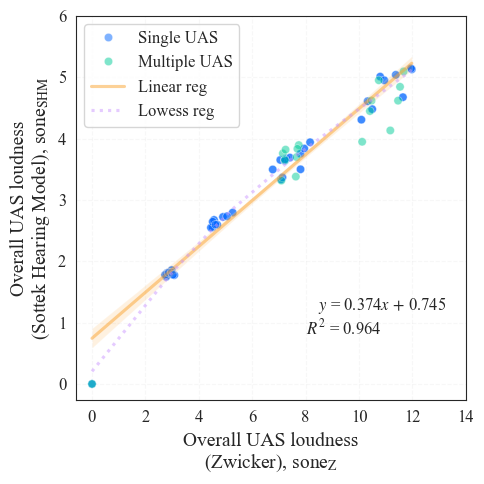

In [52]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudECMAPowAvgBin'], sm.add_constant(data['UASLoudISO1PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudECMAPowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall UAS loudness" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="Overall UAS loudness" + "\n" + "(Zwicker), " + r"sone$_{\text{Z}}$",
       yticks=range(0, 7), xticks=range(0, 16, 2))
ax.text(x=8, y=0.8, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=8, y=1.2,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvNISO1"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

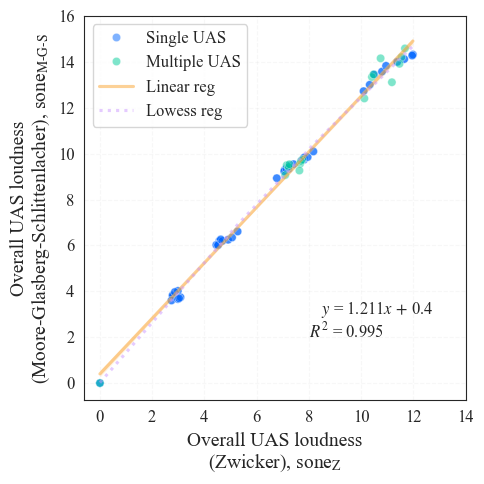

In [53]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudISO3PowAvgBin'], sm.add_constant(data['UASLoudISO1PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLoudISO1PowAvgMaxLR', y='UASLoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel="Overall UAS loudness" + "\n" + "(Zwicker), " + r"sone$_\text{Z}$",
       ylabel="Overall UAS loudness" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xticks=range(0, 16, 2), yticks=range(0, 18, 2))
ax.text(x=8, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=8, y=3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vNISO1"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

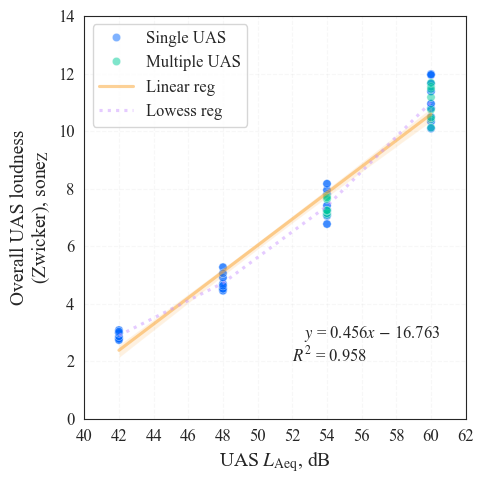

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5))

data = pd.concat([dataByStimTestA, dataByStimTestB])  # this is a fast way to strip the categories from the data frames when omitting the No UAS data for dB metrics
data = data[data['UASLAeq'] != "Baseline"]
data['UASLAeq'] = data['UASLAeq'].astype(float)

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['UASLoudISO1PowAvgMaxLR'], sm.add_constant(data['UASLAeq']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='UASLAeq', y='UASLoudISO1PowAvgMaxLR', hue='SessionPart',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='UASLAeq', y='UASLoudISO1PowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='UASLAeq', y='UASLoudISO1PowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel=r"UAS $L_\text{Aeq}$, dB",
       ylabel="Overall UAS loudness" + "\n" + "(Zwicker), " + r"sone$_\text{Z}$",
       xticks=range(40, 64, 2), yticks=range(0, 16, 2))
ax.text(x=52, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 3)))

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=52, y=2.8,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO1vLAeq"
    
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

### Proxy metrics for sound quality

#### Loudness

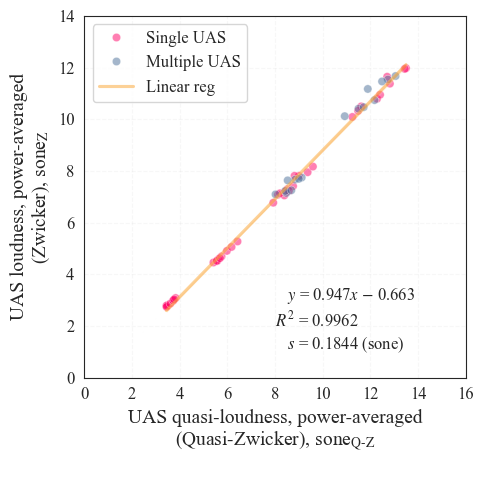

In [74]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO1PowAvgMaxLR'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power-averaged" + "\n" + "(Zwicker), " + r"sone$_\text{Z}$",
       xlabel="UAS quasi-loudness, power-averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(0, 16, 2), xticks=range(0, 18, 2))
ax.text(x=8, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=8, y=1.1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=8, y=3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO1vNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

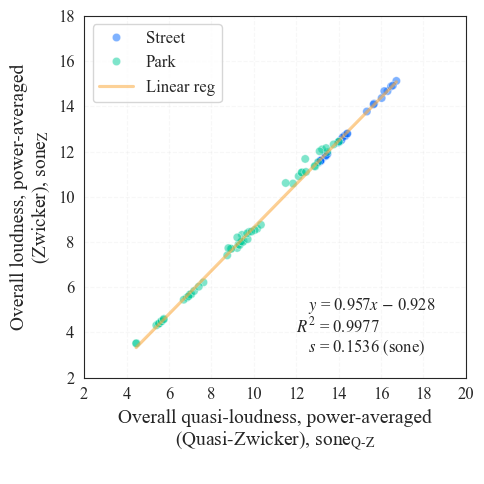

In [75]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO1PowAvgMaxLR'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO1PowAvgMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall loudness, power-averaged" + "\n" + "(Zwicker), " + r"sone$_\text{Z}$",
       xlabel="Overall quasi-loudness, power-averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(2, 20, 2), xticks=range(2, 22, 2))
ax.text(x=12, y=4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=12, y=3.1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=12, y=5,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallNISO1vNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

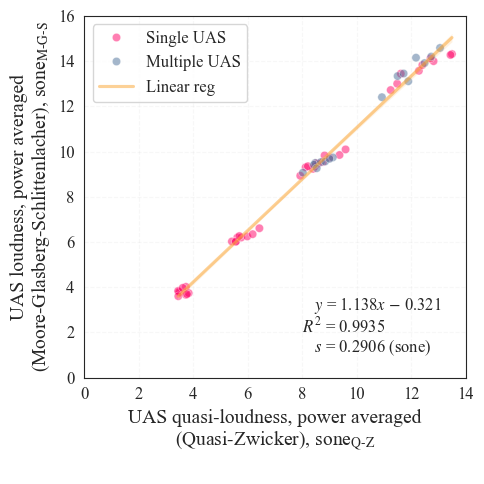

In [76]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO3PowAvgBin'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power averaged" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xlabel="UAS quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(0, 18, 2), xticks=range(0, 16, 2))
ax.text(x=8, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=8, y=1.1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=8, y=3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

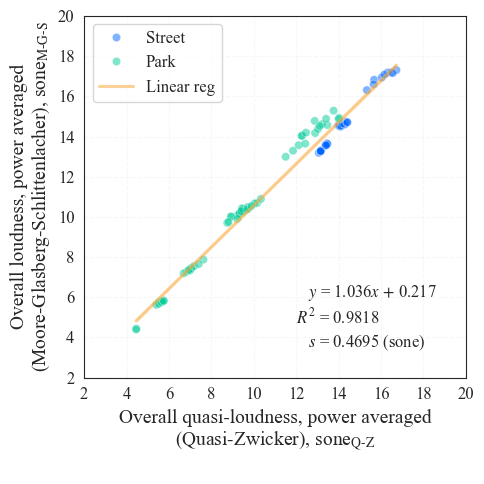

In [77]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO3PowAvgBin'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudISO3PowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall loudness, power averaged" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xlabel="Overall quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(2, 22, 2), xticks=range(2, 22, 2))
ax.text(x=12, y=4.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=12, y=3.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=12, y=6,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallNISO3vNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

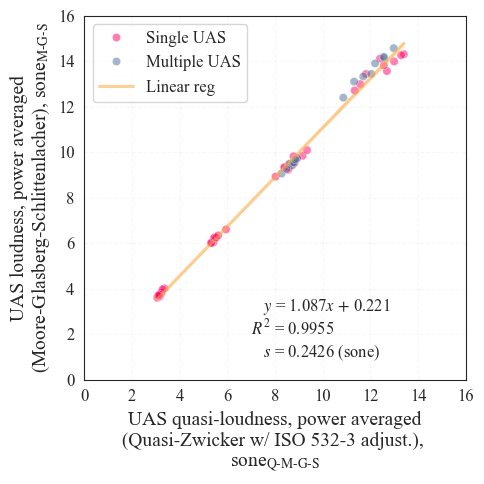

In [78]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO3PowAvgBin'], sm.add_constant(data['LoudQZ5323PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power averaged" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xlabel="UAS quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker w/ ISO 532-3 adjust.), " + "\n" + r"sone$_\text{Q-M-G-S}$",
       yticks=range(0, 18, 2), xticks=range(0, 18, 2))
ax.text(x=7, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=7, y=1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=7, y=3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNISO3vNQZ5323"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

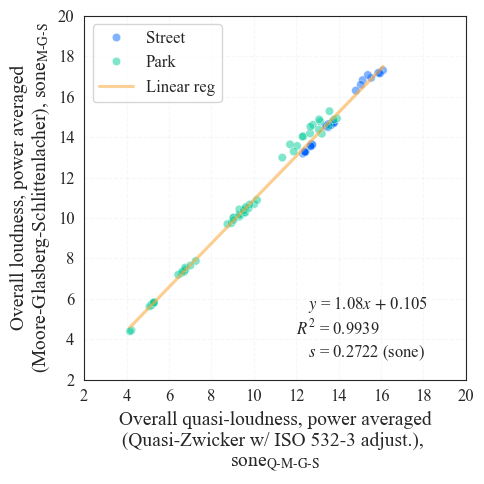

In [79]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudISO3PowAvgBin'], sm.add_constant(data['LoudQZ5323PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5323PowAvgMaxLR', y='LoudISO3PowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall loudness, power averaged" + "\n" + "(Moore-Glasberg-Schlittenlacher), " + r"sone$_\text{M-G-S}$",
       xlabel="Overall quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker w/ ISO 532-3 adjust.), " + "\n" + r"sone$_\text{Q-M-G-S}$",
       yticks=range(2, 22, 2), xticks=range(2, 22, 2))
ax.text(x=12, y=4.25, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=12, y=3.1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=12, y=5.5,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallNISO3vNQZ5323"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

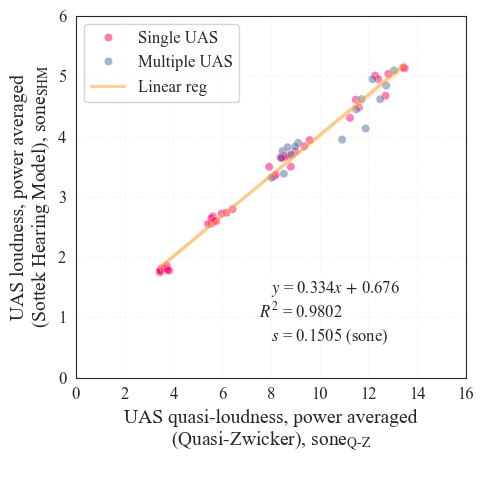

In [80]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudECMAPowAvgBin'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power averaged" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="UAS quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(0, 7, 1), xticks=range(0, 18, 2))
ax.text(x=7.5, y=1, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=7.5, y=0.6, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=7.5, y=1.4,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

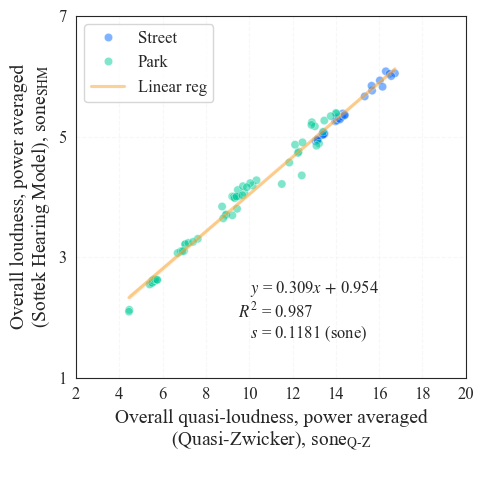

In [81]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudECMAPowAvgBin'], sm.add_constant(data['LoudQZ5321PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ5321PowAvgMaxLR', y='LoudECMAPowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall loudness, power averaged" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="Overall quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker), " + r"sone$_\text{Q-Z}$" + "\n",
       yticks=range(1, 8, 2), xticks=range(2, 22, 2))
ax.text(x=9.5, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=9.5, y=1.65, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=9.5, y=2.4,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallNSHMvNQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

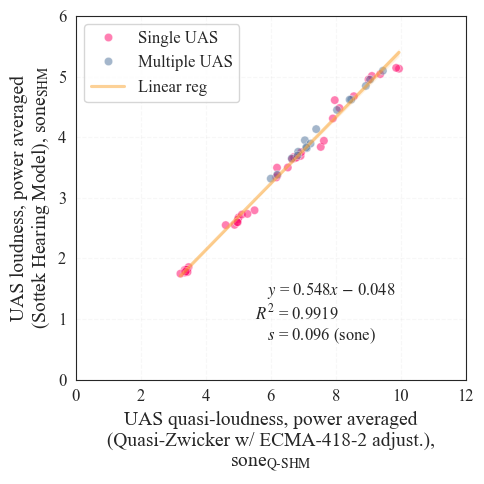

In [82]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudECMAPowAvgBin'], sm.add_constant(data['LoudQZ4182PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power averaged" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="UAS quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"sone$_\text{Q-SHM}$",
       yticks=range(0, 7, 1), xticks=range(0, 14, 2))
ax.text(x=5.5, y=1, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=5.5, y=0.65, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=5.5, y=1.4,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvNQZ4182"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

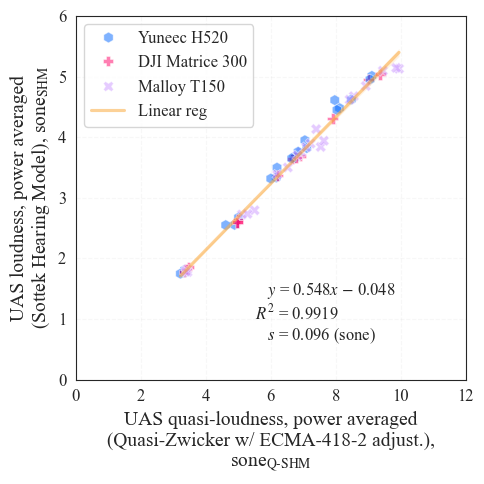

In [22]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(UASType=data.UASType.map({'H520': "Yuneec H520", 'M300': "DJI Matrice 300", 'T150': "Malloy T150"}))

# fit linear regression model 
mod = sm.OLS(data['LoudECMAPowAvgBin'], sm.add_constant(data['LoudQZ4182PowAvgMaxLR']), hasconst=True)
res = mod.fit()

markers = {"Yuneec H520": "h", "DJI Matrice 300": "P", "Malloy T150": "X"}
sns.scatterplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin', hue='UASType',
                palette=[mycolours[0], mycolours[2], mycolours[5]], alpha=0.5, ax=ax, style='UASType',
                style_order=["Yuneec H520", "DJI Matrice 300", "Malloy T150"], markers=markers, s=60)
sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS loudness, power averaged" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="UAS quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"sone$_\text{Q-SHM}$",
       yticks=range(0, 7, 1), xticks=range(0, 14, 2))
ax.text(x=5.5, y=1, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=5.5, y=0.65, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=5.5, y=1.4,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatNSHMvNQZ4182ByType"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

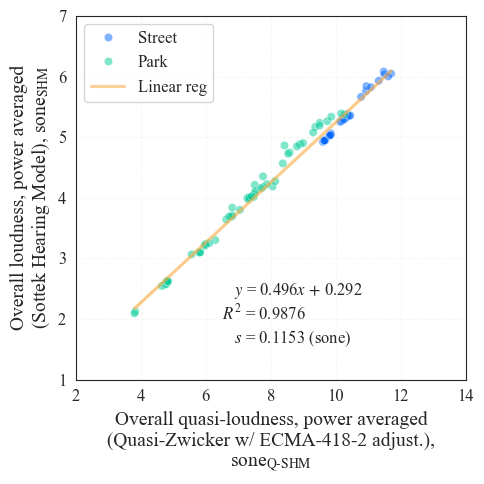

In [83]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['LoudECMAPowAvgBin'], sm.add_constant(data['LoudQZ4182PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='LoudQZ4182PowAvgMaxLR', y='LoudECMAPowAvgBin',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall loudness, power averaged" + "\n" + "(Sottek Hearing Model), " + r"sone$_\text{SHM}$",
       xlabel="Overall quasi-loudness, power averaged" + "\n" + "(Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"sone$_\text{Q-SHM}$",
       yticks=range(1, 8, 1), xticks=range(2, 16, 2))
ax.text(x=6.5, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=6.5, y=1.6, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=6.5, y=2.4,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallNSHMvNQZ4182"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

#### Sharpness

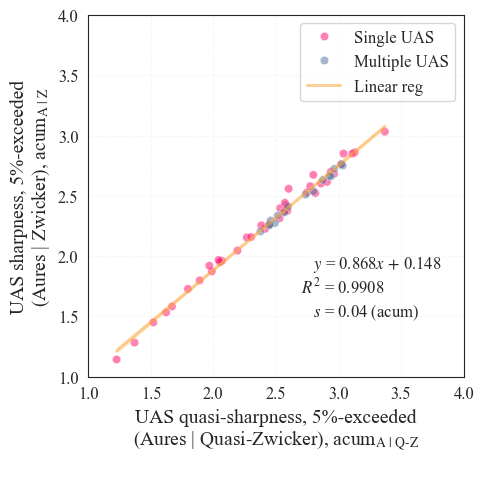

In [84]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO105ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Zwicker), " + r"acum$_\text{A | Z}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSAISO1vSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

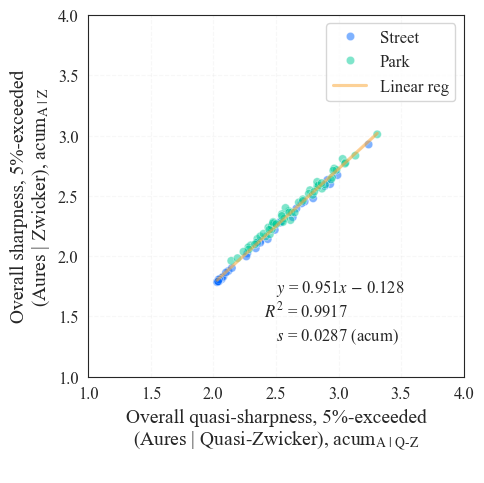

In [85]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO105ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO105ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, 5%-exceeded" + "\n" + "(Aures | Zwicker), " + r"acum$_\text{A | Z}$",
       xlabel="Overall quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.4, y=1.5, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.3, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.7,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallSAISO1vSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

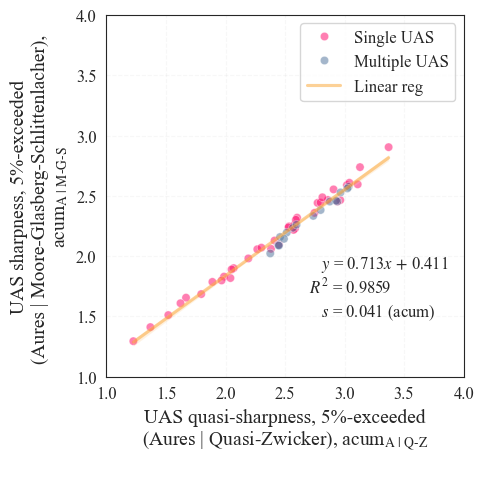

In [86]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO305ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Moore-Glasberg-Schlittenlacher), " + "\n" + r"acum$_\text{A | M-G-S}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSAISO3vSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

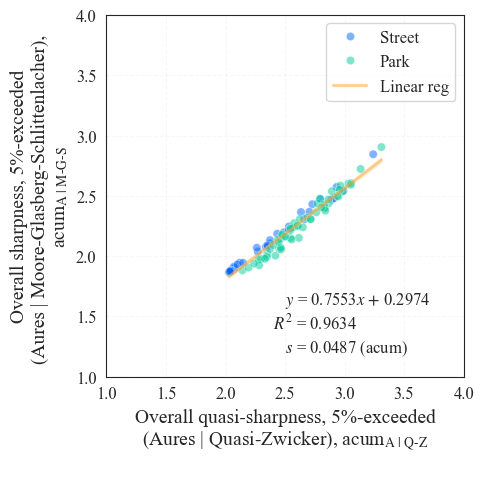

In [87]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO305ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurISO305ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, 5%-exceeded" + "\n" + "(Aures | Moore-Glasberg-Schlittenlacher), " + "\n" + r"acum$_\text{A | M-G-S}$",
       xlabel="Overall quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.2, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.6,
        s=r"   $y$ = " + display_round(res.params.iloc[1], 4, False) + r"$x$" + " " + icept + " " + display_round(res.params.iloc[0], 4, False))
ax.legend()

if saveplots:

    filename = "SQscatOallSAISO3vSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

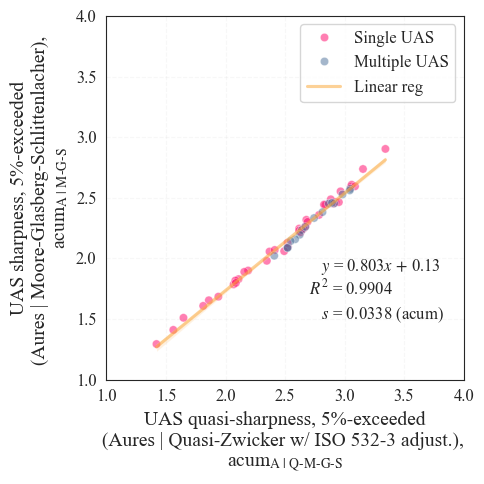

In [88]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO305ExMaxLR'], sm.add_constant(data['SharpAurQZ532305ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Moore-Glasberg-Schlittenlacher), " + "\n" + r"acum$_\text{A | M-G-S}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker w/ ISO 532-3 adjust.), " + "\n" + r"acum$_\text{A | Q-M-G-S}$",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSAISO3vSAQZ5323"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

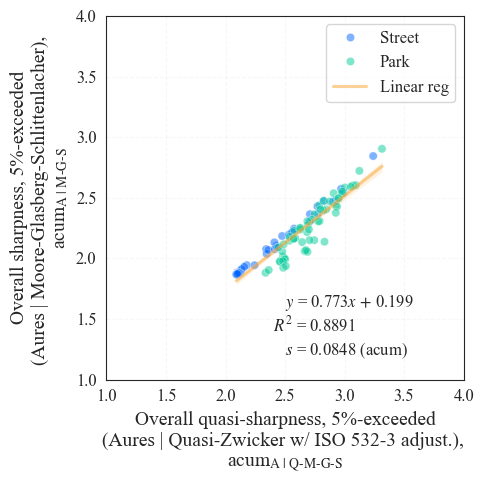

In [89]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurISO305ExMaxLR'], sm.add_constant(data['SharpAurQZ532305ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532305ExMaxLR', y='SharpAurISO305ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, 5%-exceeded" + "\n" + "(Aures | Moore-Glasberg-Schlittenlacher), " + "\n" + r"acum$_\text{A | M-G-S}$",
       xlabel="Overall quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker w/ ISO 532-3 adjust.), " + "\n" + r"acum$_\text{A | Q-M-G-S}$",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.2, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.6,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()


if saveplots:

    filename = "SQscatOallSAISO3vSAQZ5323"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

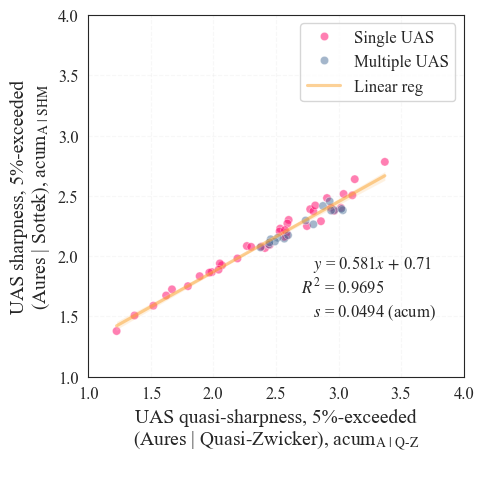

In [90]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHM05ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Sottek), " + r"acum$_\text{A | SHM}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")


# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSASHMvSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

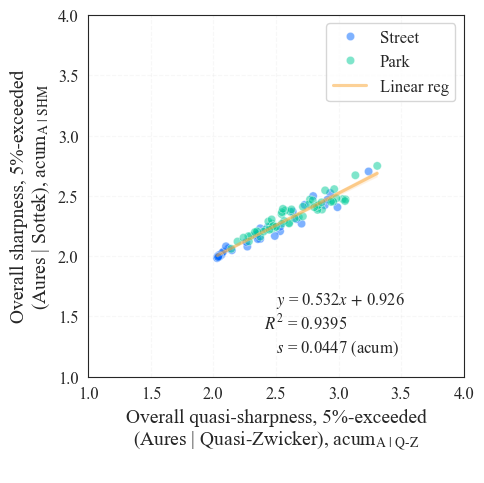

In [91]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHM05ExMaxLR'], sm.add_constant(data['SharpAurQZ532105ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ532105ExMaxLR', y='SharpAurSHM05ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, 5%-exceeded" + "\n" + "(Aures | Sottek), " + r"acum$_\text{A | SHM}$",
       xlabel="Overall quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker), " + r"acum$_\text{A | Q-Z}$" + "\n",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.2, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.6,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallSASHMvSAQZ5321"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

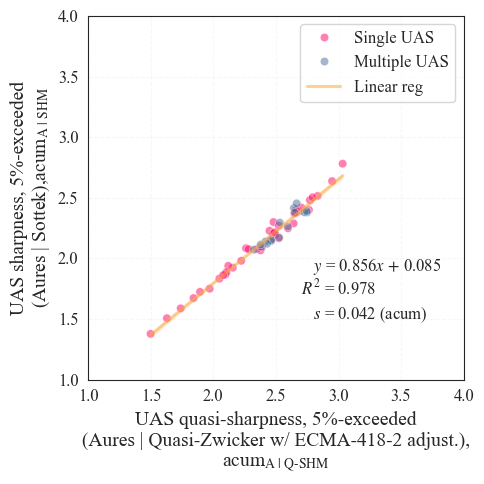

In [92]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHM05ExMaxLR'], sm.add_constant(data['SharpAurQZ418205ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Sottek)," + r"acum$_\text{A | SHM}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"acum$_\text{A | Q-SHM}$",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSASHMvSAQZ4182"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

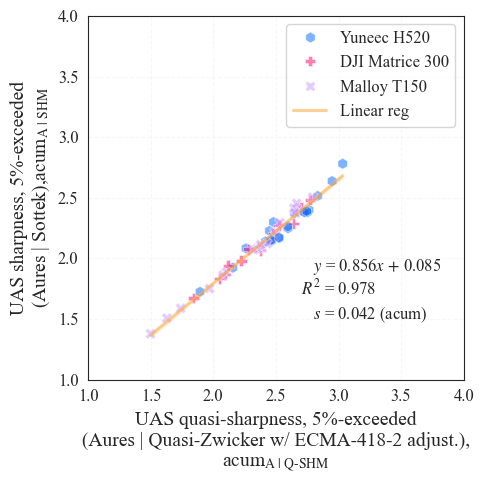

In [23]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(UASType=data.UASType.map({'H520': "Yuneec H520", 'M300': "DJI Matrice 300", 'T150': "Malloy T150"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHM05ExMaxLR'], sm.add_constant(data['SharpAurQZ418205ExMaxLR']), hasconst=True)
res = mod.fit()

markers = {"Yuneec H520": "h", "DJI Matrice 300": "P", "Malloy T150": "X"}
sns.scatterplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR', hue='UASType',
                palette=[mycolours[0], mycolours[2], mycolours[5]], alpha=0.5, ax=ax,
                style='UASType', style_order=["Yuneec H520", "DJI Matrice 300", "Malloy T150"], markers=markers, s=60)
sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, 5%-exceeded" + "\n" + "(Aures | Sottek)," + r"acum$_\text{A | SHM}$",
       xlabel="UAS quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"acum$_\text{A | Q-SHM}$",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.7, y=1.7, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.7, y=1.5, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.7, y=1.9,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSASHMvSAQZ4182ByType"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

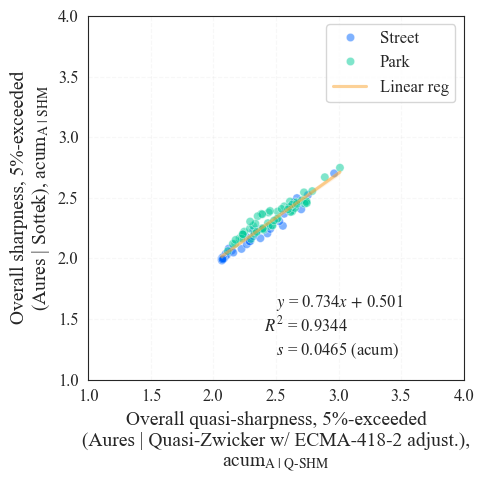

In [93]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHM05ExMaxLR'], sm.add_constant(data['SharpAurQZ418205ExMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ418205ExMaxLR', y='SharpAurSHM05ExMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, 5%-exceeded" + "\n" + "(Aures | Sottek), " + r"acum$_\text{A | SHM}$",
       xlabel="Overall quasi-sharpness, 5%-exceeded" + "\n" + "(Aures | Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"acum$_\text{A | Q-SHM}$",
       yticks=np.arange(1, 4.5, 0.5), xticks=np.arange(1, 4.5, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.2, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.6,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallSASHMvSAQZ4182"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

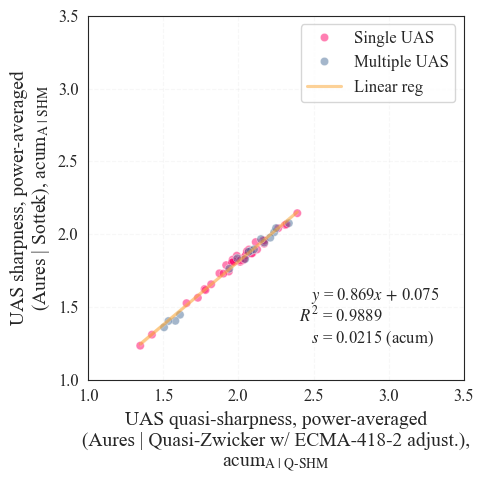

In [94]:
fig, ax = plt.subplots(figsize=(5, 5))

data = auxData

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHMPowAvgMaxLR'], sm.add_constant(data['SharpAurQZ4182PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR', hue='SessionPart',
                palette=mycolours[2:4], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="UAS sharpness, power-averaged" + "\n" + "(Aures | Sottek), " + r"acum$_\text{A | SHM}$",
       xlabel="UAS quasi-sharpness, power-averaged" + "\n" + "(Aures | Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"acum$_\text{A | Q-SHM}$",
       yticks=np.arange(1, 4, 0.5), xticks=np.arange(1, 4, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.25, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.55,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatSASHMvSAQZ4182PowAvg"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

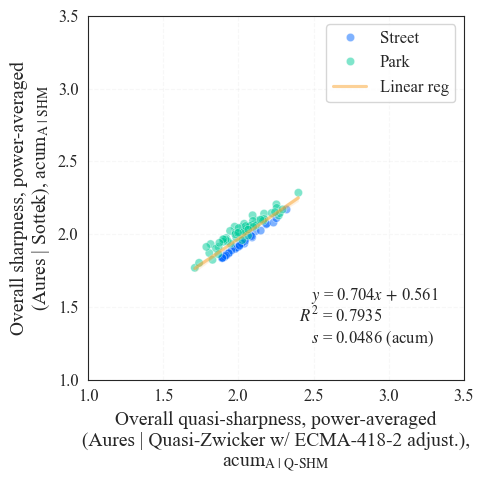

In [95]:
fig, ax = plt.subplots(figsize=(5, 5))

data = dataByStimTest

data = data.assign(SessionPart=data.SessionPart.map({'A': "Single UAS", 'B': "Multiple UAS"}))

# fit linear regression model 
mod = sm.OLS(data['SharpAurSHMPowAvgMaxLR'], sm.add_constant(data['SharpAurQZ4182PowAvgMaxLR']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
# sns.regplot(data=data, x='SharpAurQZ4182PowAvgMaxLR', y='SharpAurSHMPowAvgMaxLR',
#             scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
#             line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(ylabel="Overall sharpness, power-averaged" + "\n" + "(Aures | Sottek), " + r"acum$_\text{A | SHM}$",
       xlabel="Overall quasi-sharpness, power-averaged" + "\n" + "(Aures | Quasi-Zwicker w/ ECMA-418-2 adjust.)," + "\n" + r"acum$_\text{A | Q-SHM}$",
       yticks=np.arange(1, 4, 0.5), xticks=np.arange(1, 4, 0.5))
ax.text(x=2.4, y=1.4, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.4, y=1.25, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (acum)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.4, y=1.55,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatOallSASHMvSAQZ4182PowAvg"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

## Partial loudness comparisons

C:\Users\m_lot\AppData\Local\Temp\ipykernel_67920\2917982531.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['LogPartLoudMGLTPowAvg'] = np.log10(data['PartLoudMGLTPowAvg'])


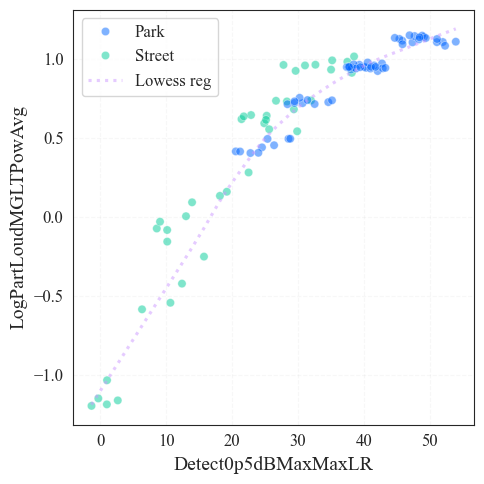

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5))


data = dataByStimTest[dataByStimTest['UASLAeq'] != 'Baseline']
data['LogPartLoudMGLTPowAvg'] = np.log10(data['PartLoudMGLTPowAvg'])

sns.scatterplot(data=data, x='Detect0p5dBMaxMaxLR', y='LogPartLoudMGLTPowAvg', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)

sns.regplot(data=data, x='Detect0p5dBMaxMaxLR', y='LogPartLoudMGLTPowAvg',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')

ax.legend()


plt.show()

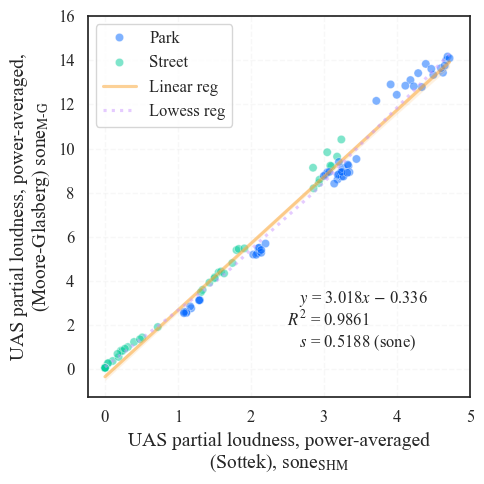

In [81]:
fig, ax = plt.subplots(figsize=(5, 5))


data = dataByStimTest[dataByStimTest['UASLAeq'] != 'Baseline']


# fit linear regression model 
mod = sm.OLS(data['PartLoudMGLTPowAvg'], sm.add_constant(data['PartLoudSHMPowAvgBin']), hasconst=True)
res = mod.fit()

sns.scatterplot(data=data, x='PartLoudSHMPowAvgBin', y='PartLoudMGLTPowAvg', hue='AmbientEnv',
                palette=mycolours[0:2], alpha=0.5, ax=ax)
sns.regplot(data=data, x='PartLoudSHMPowAvgBin', y='PartLoudMGLTPowAvg',
            scatter=False, seed=303, n_boot=2000, color=mycolours[4], lowess=False, label="Linear reg",
            line_kws={'linestyle': '-', 'alpha': 0.5})
sns.regplot(data=data, x='PartLoudSHMPowAvgBin', y='PartLoudMGLTPowAvg',
            scatter=False, seed=303, n_boot=2000, color=mycolours[5], lowess=True, label="Lowess reg",
            line_kws={'linestyle': ':', 'alpha': 0.5})
ax.grid(alpha=0.15, linestyle='--')
ax.set(xlabel="UAS partial loudness, power-averaged" + "\n" + r"(Sottek), sone$_\text{SHM}$",
       ylabel="UAS partial loudness, power-averaged," + "\n" + r"(Moore-Glasberg) sone$_\text{M-G}$",
       yticks=np.arange(0, 17, 2), xticks=np.arange(0, 6, 1))
ax.text(x=2.5, y=2, s=r"$R^2$ = " + str(round(res.rsquared, 4)))
# calculate standard error of the estimate for the regression line
ax.text(x=2.5, y=1, s=r"   $s$ = " + str(round(np.sqrt(res.mse_resid), 4)) + " (sone)")

# generate string for intercept sign
if np.sign(res.params.iloc[0]) < 0:
    icept = r"$ - $"
else:
    icept = r"$ + $"

ax.text(x=2.5, y=3,
        s=r"   $y$ = " + str(round(res.params.iloc[1], 3)) + r"$x$" + " " + icept + " " + str(abs(round(res.params.iloc[0], 3))))
ax.legend()

if saveplots:

    filename = "SQscatPartLoudMGLTvPartLoudSHMPowAvg"

    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

## Psychoacoustic annoyance analysis

Create a function to calculate psychoacoustic annoyance

In [57]:
def psychAnnoy(loudness, sharpness, roughness, fluctstr=None, tonality=None, impulsivity=None, method='widmann'):

    # initialise arrays
    omS = np.zeros(len(sharpness))
    
    if method in ['widmann', 'di', 'more', 'torija', 'willemsen']:

        if method.lower() == 'willemsen':

            pa = 27.73 + 1.24*impulsivity + 0.86*loudness*sharpness + 1.81*roughness

        else:

            omS[sharpness > 1.75] = 0.25*(sharpness[sharpness > 1.75] - 1.75)*np.log10(loudness[sharpness > 1.75] + 10)
        
            omFR = (2.18/loudness**0.4)*(0.4*fluctstr + 0.6*roughness)
            
            if method.lower() == 'widmann':
                g0 = 0
                gS = 1
                gFR = 1
                gT = 0
                gI = 0
        
                omT = 0
                omI = 0
        
            elif method.lower() == 'more':

                g0 = -0.16
                gS = 11.48
                gFR = 0.84
                gT = 1.25
                gI = 0

                omT = (1 - np.exp(-0.29*loudness))*(1 - np.exp(-5.49*tonality))
                omI = 0
            
            elif method.lower() == 'di':
                g0 = 0
                gS = 1
                gFR = 1
                gT = 1
                gI = 0

                omT = 6.41/loudness**0.52*tonality
                omI = 0

            elif method.lower() == 'torija':
                g0 = 103.08
                gS = 339.49
                gFR = 121.88
                gT = 77.2 
                gI = 29.29

                omT = (1 - np.exp(-0.29*loudness))*(1 - np.exp(-5.49*tonality))
                omI = 0.075*impulsivity/loudness**-1.334

            sqm = np.maximum(0, g0 + gS*omS**2 + gFR*omFR**2 + gT*omT**2 + gI*omI**2)

            pa = loudness*(1 + np.sqrt(sqm))

    else:
        raise ValueError("Input 'method' must be one of 'widmann', 'di', 'more', 'torija', 'willemsen'")

    return pa

In [66]:
paRMSEMean = pd.DataFrame(index=["Widmann_1", "More_1", "Di_1", "Torija_1", "Widmann_2", "More_2", "Di_2", "Torija_2"],
                              columns = ["Overall", "UAS", "Ambient", "UAS+ambient"], dtype=float)


#### Widmann psychoacoustic annoyance

In [ ]:
inputSQMs = {'loudness' : 'LoudISO105ExMaxLR',
             'sharpness' : 'SharpDIN05ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctFZ05ExMaxLR',
             'tonality' : None,
             'impulsivity' : None}

##### Part A

In [62]:
# calculate overall psychoacoustic annoyance
paPtAWidmann_1 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                            sharpness=dataByStimTestA[inputSQMs['sharpness']],
                            roughness=dataByStimTestA[inputSQMs['roughness']],
                            fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                            tonality=None,
                            impulsivity=None,
                            method='widmann')

panPtAWidmann_1 = pd.DataFrame(paPtAWidmann_1/paPtAWidmann_1.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [63]:
# calculate UAS only psychoacoustic annoyance
paPtAUASWidmann_1 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                               sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                               roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtAUASWidmann_1.fillna(0, inplace=True)

panPtAWidmann_1['UASMean'] = paPtAUASWidmann_1/paPtAUASWidmann_1.max()*dataByStimTestA['AnnoyMean'].max()

In [64]:
# calculate ambient only psychoacoustic annoyance
paPtAAmbWidmann_1 = psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                               sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                               roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtAAmbWidmann_1.fillna(0, inplace=True)

panPtAWidmann_1['AmbMean'] = paPtAAmbWidmann_1/paPtAAmbWidmann_1.max()*dataByStimTestA['AnnoyMean'].max()

In [65]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbWidmann_1 = np.sqrt(paPtAUASWidmann_1**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                                 sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                                 roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                                 fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                                 tonality=None,
                                                                 impulsivity=None,
                                                                 method='widmann')**2)

panPtAWidmann_1['UASAmbMean'] = paPtAUASAmbWidmann_1/paPtAUASAmbWidmann_1.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [67]:
# calculate overall psychoacoustic annoyance
paPtBWidmann_1 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                            sharpness=dataByStimTestB[inputSQMs['sharpness']],
                            roughness=dataByStimTestB[inputSQMs['roughness']],
                            fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                            tonality=None,
                            impulsivity=None,
                            method='widmann')

panPtBWidmann_1 = pd.DataFrame(paPtBWidmann_1/paPtBWidmann_1.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [68]:
# calculate UAS only psychoacoustic annoyance
paPtBUASWidmann_1 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                               sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                               roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtBUASWidmann_1.fillna(0, inplace=True)

panPtBWidmann_1['UASMean'] = paPtBUASWidmann_1/paPtBUASWidmann_1.max()*dataByStimTestB['AnnoyMean'].max()

In [69]:
# calculate ambient only psychoacoustic annoyance
paPtBAmbWidmann_1 = psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                               sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                               roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtBAmbWidmann_1.fillna(0, inplace=True)

panPtBWidmann_1['AmbMean'] = paPtBAmbWidmann_1/paPtBAmbWidmann_1.max()*dataByStimTestB['AnnoyMean'].max()

In [70]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbWidmann_1 = np.sqrt(paPtBUASWidmann_1**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                                 sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                                 roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                                 fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                                 tonality=None,
                                                                 impulsivity=None,
                                                                 method='widmann')**2)

panPtBWidmann_1['UASAmbMean'] = paPtBUASAmbWidmann_1/paPtBUASAmbWidmann_1.max()*dataByStimTestB['AnnoyMean'].max()

In [71]:
datasetsAMean = [panPtAWidmann_1['OvallMean'], panPtAWidmann_1['UASMean'], panPtAWidmann_1['AmbMean'], panPtAWidmann_1['UASAmbMean']]
datasetsBMean = [panPtBWidmann_1['OvallMean'], panPtBWidmann_1['UASMean'], panPtBWidmann_1['AmbMean'], panPtBWidmann_1['UASAmbMean']]

##### Model error

In [72]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Widmann_1", paRMSEMean.columns[ii]] = RMSE

##### Plot results

In [92]:
ii = 0
datasetA = datasetsAMean[ii]
datasetB = datasetsBMean[ii]
jj = 0

In [95]:
if ii > 1:
    iij = ii - 2
else:
    iij = ii

In [96]:
iij

0

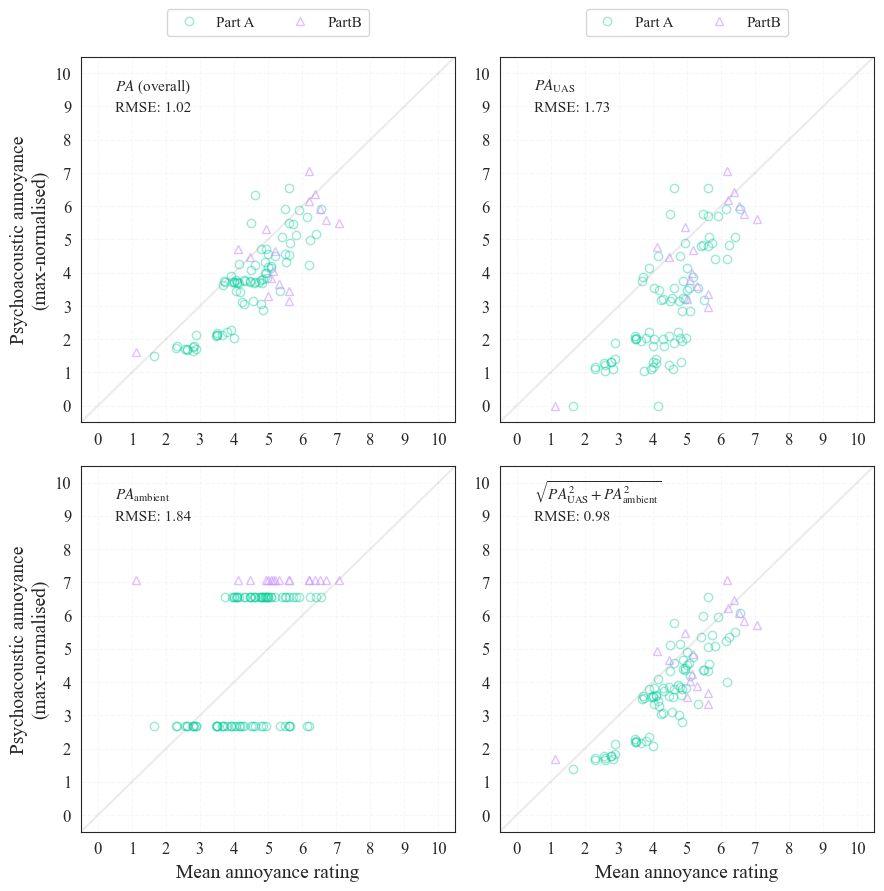

In [101]:
# plot results for Widmann model

# mean
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(9, 9))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]

    axCoords = [(0, 0), (0, 1), (1, 0), (1, 1)][ii]
    
    axs[axCoords].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[1],
                 alpha=0.4)
    
    axs[axCoords].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[5],
                 alpha=0.6)

    axs[axCoords].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                      yticks=range(0, 11), ylim=[-0.5, 10.5])

    axs[axCoords].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[axCoords].grid(alpha=0.15, linestyle='--')

    axs[axCoords].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\it{PA}_\\text{ambient}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[axCoords].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Widmann_1", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0 or ii == 2:
        axs[axCoords].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")

    if ii == 2 or ii == 3:
        axs[axCoords].set(xlabel="Mean annoyance rating")


    if ii == 0 or ii == 1:
        axs[axCoords].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

# if saveplots:
#     plt.savefig(os.path.join(outFigPath, "svg", "PAWidmannMean_1.svg"),
#                 format='svg')
#     plt.savefig(os.path.join(outFigPath, "pdf", "PAWidmannMean_1.pdf"),
#                 format='pdf')

plt.show()


#### More psychoacoustic annoyance

In [ ]:
inputSQMs = {'loudness' : 'LoudISO105ExMaxLR',
             'sharpness' : 'SharpvBISO105ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctFZ05ExMaxLR',
             'tonality' : 'TonalAur05ExMaxLR',
             'impulsivity' : None}

##### Part A

In [50]:
# calculate overall psychoacoustic annoyance
paPtAMore_1 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                           sharpness=dataByStimTestA[inputSQMs['sharpness']],
                           roughness=dataByStimTestA[inputSQMs['roughness']],
                           fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                           tonality=dataByStimTestA[inputSQMs['tonality']],
                           impulsivity=None,
                           method='more')

panPtAMore_1 = pd.DataFrame(paPtAMore_1/paPtAMore_1.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [52]:
# calculate UAS only psychoacoustic annoyance
paPtAUASMore_1 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                            sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                            roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                            fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                            tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                            impulsivity=None,
                            method='more')
paPtAUASMore_1.fillna(0, inplace=True)

panPtAMore_1['UASMean'] = paPtAUASMore_1/paPtAUASMore_1.max()*dataByStimTestA['AnnoyMean'].max()

In [53]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbMore_1 = np.sqrt(paPtAUASMore_1**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                           sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                           roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                           fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                           tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                           impulsivity=None,
                                                          method='more')**2)

panPtAMore_1['UASAmbMean'] = paPtAUASAmbMore_1/paPtAUASAmbMore_1.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [54]:
# calculate overall psychoacoustic annoyance
paPtBMore_1 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                         sharpness=dataByStimTestB[inputSQMs['sharpness']],
                         roughness=dataByStimTestB[inputSQMs['roughness']],
                         fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                         tonality=dataByStimTestB[inputSQMs['tonality']],
                         impulsivity=None,
                         method='more')

panPtBMore_1 = pd.DataFrame(paPtBMore_1/paPtBMore_1.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [55]:
# calculate UAS only psychoacoustic annoyance
paPtBUASMore_1 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                            sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                            roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                            fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                            tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                            impulsivity=None,
                            method='more')
paPtBUASMore_1.fillna(0, inplace=True)

panPtBMore_1['UASMean'] = paPtBUASMore_1/paPtBUASMore_1.max()*dataByStimTestB['AnnoyMean'].max()

In [56]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbMore_1 = np.sqrt(paPtBUASMore_1**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                           sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                           roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                           fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                           tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                           impulsivity=None,
                                                           method='more')**2)

panPtBMore_1['UASAmbMean'] = paPtBUASAmbMore_1/paPtBUASAmbMore_1.max()*dataByStimTestB['AnnoyMean'].max()

In [57]:
datasetsAMean = [panPtAMore_1['OvallMean'], panPtAMore_1['UASMean'], panPtAMore_1['UASAmbMean']]
datasetsBMean = [panPtBMore_1['OvallMean'], panPtBMore_1['UASMean'], panPtBMore_1['UASAmbMean']]


##### Model error

In [58]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["More_1", paRMSEMean.columns[ii]] = RMSE

##### Plot results

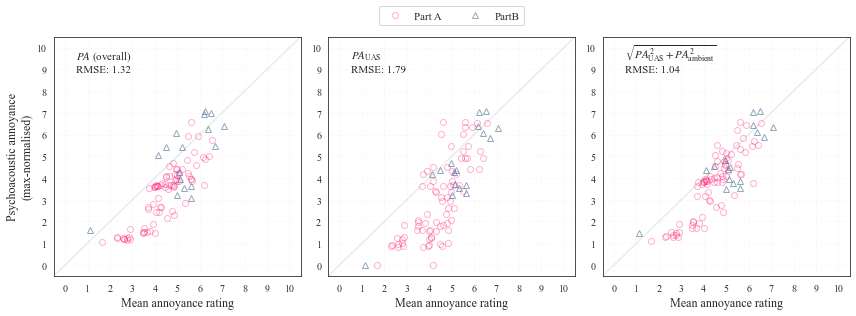

In [59]:
# plot results for More model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[2],
                 alpha=0.3)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[3],
                 alpha=0.6)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["More_1", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")

    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PAMoreMean_1.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PAMoreMean_1.pdf"),
                format='pdf')

plt.show()


#### Di psychoacoustic annoyance

In [ ]:
inputSQMs = {'loudness' : 'LoudISO105ExMaxLR',
             'sharpness' : 'SharpAurISO105ExMaxLR',
             'roughness' : 'RoughECMAAvgBin',
             'fluctstr' : 'FluctOldSHMAvgBin',
             'tonality' : 'TonalAurAvgMaxLR',
             'impulsivity' : None}

##### Part A

In [61]:
# calculate overall psychoacoustic annoyance
paPtADi_1 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                       sharpness=dataByStimTestA[inputSQMs['sharpness']],
                       roughness=dataByStimTestA[inputSQMs['roughness']],
                       fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                       tonality=dataByStimTestA[inputSQMs['tonality']],
                       impulsivity=None,
                       method='di')

panPtADi_1 = pd.DataFrame(paPtADi_1/paPtADi_1.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [64]:
# calculate UAS only psychoacoustic annoyance
paPtAUASDi_1 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                          sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                          roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                          fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                          tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                          impulsivity=None,
                          method='di')
paPtAUASDi_1.fillna(0, inplace=True)

panPtADi_1['UASMean'] = paPtAUASDi_1/paPtAUASDi_1.max()*dataByStimTestA['AnnoyMean'].max()

In [63]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbDi_1 = np.sqrt(paPtAUASDi_1**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                       sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                       roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                       fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                       tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                       impulsivity=None,
                                                       method='di')**2)

panPtADi_1['UASAmbMean'] = paPtAUASAmbDi_1/paPtAUASAmbDi_1.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [65]:
# calculate overall psychoacoustic annoyance
paPtBDi_1 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                       sharpness=dataByStimTestB[inputSQMs['sharpness']],
                       roughness=dataByStimTestB[inputSQMs['roughness']],
                       fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                       tonality=dataByStimTestB[inputSQMs['tonality']],
                       impulsivity=None,
                       method='di')

panPtBDi_1 = pd.DataFrame(paPtBDi_1/paPtBDi_1.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [66]:
# calculate UAS only psychoacoustic annoyance
paPtBUASDi_1 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                          sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                          roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                          fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                          tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                          impulsivity=None,
                          method='di')
paPtBUASDi_1.fillna(0, inplace=True)

panPtBDi_1['UASMean'] = paPtBUASDi_1/paPtBUASDi_1.max()*dataByStimTestB['AnnoyMean'].max()

In [67]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbDi_1 = np.sqrt(paPtBUASDi_1**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                       sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                       roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                       fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                       tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                       impulsivity=None,
                                                       method='di')**2)

panPtBDi_1['UASAmbMean'] = paPtBUASAmbDi_1/paPtBUASAmbDi_1.max()*dataByStimTestB['AnnoyMean'].max()

In [68]:
datasetsAMean = [panPtADi_1['OvallMean'], panPtADi_1['UASMean'], panPtADi_1['UASAmbMean']]
datasetsBMean = [panPtBDi_1['OvallMean'], panPtBDi_1['UASMean'], panPtBDi_1['UASAmbMean']]


##### Model error

In [69]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Di_1", paRMSEMean.columns[ii]] = RMSE

##### Plot results

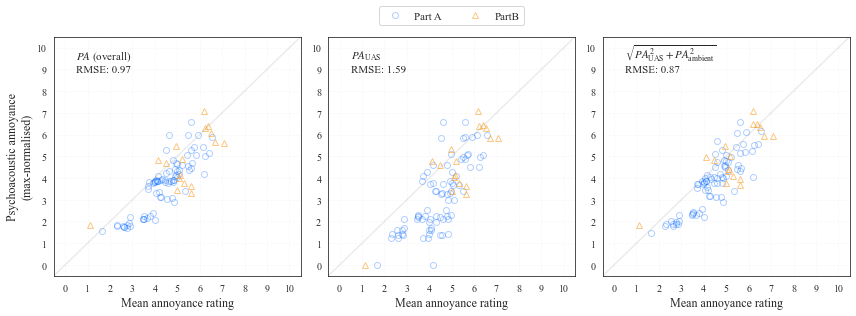

In [70]:
# plot results for Di model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[0],
                 alpha=0.3)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[4],
                 alpha=0.6)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Di_1", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")


    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PADiMean_1.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PADiMean_1.pdf"),
                format='pdf')

plt.show()


#### Torija psychoacoustic annoyance

In [ ]:
inputSQMs = {'loudness' : 'LoudISO105ExMaxLR',
             'sharpness' : 'SharpDIN05ExMaxLR',
             'roughness' : 'RoughECMA05ExBin',
             'fluctstr' : 'FluctOldSHM05ExBin',
             'tonality' : 'TonalAur05ExMaxLR',
             'impulsivity' : 'ImpulsSHM05ExMaxLR'}

##### Part A

In [13]:
# calculate overall psychoacoustic annoyance
paPtATorija_1 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                           sharpness=dataByStimTestA[inputSQMs['sharpness']],
                           roughness=dataByStimTestA[inputSQMs['roughness']],
                           fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                           tonality=dataByStimTestA[inputSQMs['tonality']],
                           impulsivity=dataByStimTestA[inputSQMs['impulsivity']],
                           method='torija')

panPtATorija_1 = pd.DataFrame(paPtATorija_1/paPtATorija_1.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [196]:
# calculate UAS only psychoacoustic annoyance
paPtAUASTorija_1 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                              sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                              roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                              fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                              tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                              impulsivity=dataByStimTestA["UAS" + inputSQMs['impulsivity']],
                              method='torija')
paPtAUASTorija_1.fillna(0, inplace=True)

panPtATorija_1['UASMean'] = paPtAUASTorija_1/paPtAUASTorija_1.max()*dataByStimTestA['AnnoyMean'].max()

In [197]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbTorija_1 = np.sqrt(paPtAUASTorija_1**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                               sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                               roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                               fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                               tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                               impulsivity=dataByStimTestA["Amb" + inputSQMs['impulsivity']],
                                                               method='torija')**2)

panPtATorija_1['UASAmbMean'] = paPtAUASAmbTorija_1/paPtAUASAmbTorija_1.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [200]:
# calculate overall psychoacoustic annoyance
paPtBTorija_1 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                           sharpness=dataByStimTestB[inputSQMs['sharpness']],
                           roughness=dataByStimTestB[inputSQMs['roughness']],
                           fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                           tonality=dataByStimTestB[inputSQMs['tonality']],
                           impulsivity=dataByStimTestB[inputSQMs['impulsivity']],
                           method='torija')

panPtBTorija_1 = pd.DataFrame(paPtBTorija_1/paPtBTorija_1.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [201]:
# calculate UAS only psychoacoustic annoyance
paPtBUASTorija_1 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                              sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                              roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                              fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                              tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                              impulsivity=dataByStimTestB["UAS" + inputSQMs['impulsivity']],
                              method='torija')
paPtBUASTorija_1.fillna(0, inplace=True)

panPtBTorija_1['UASMean'] = paPtBUASTorija_1/paPtBUASTorija_1.max()*dataByStimTestB['AnnoyMean'].max()

In [202]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbTorija_1 = np.sqrt(paPtBUASTorija_1**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                               sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                               roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                               fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                               tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                               impulsivity=dataByStimTestB["Amb" + inputSQMs['impulsivity']],
                                                               method='torija')**2)

panPtBTorija_1['UASAmbMean'] = paPtBUASAmbTorija_1/paPtBUASAmbTorija_1.max()*dataByStimTestB['AnnoyMean'].max()

In [203]:
datasetsAMean = [panPtATorija_1['OvallMean'], panPtATorija_1['UASMean'], panPtATorija_1['UASAmbMean']]
datasetsBMean = [panPtBTorija_1['OvallMean'], panPtBTorija_1['UASMean'], panPtBTorija_1['UASAmbMean']]


##### Model error

In [204]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Torija_1", paRMSEMean.columns[ii]] = RMSE

##### Plot results

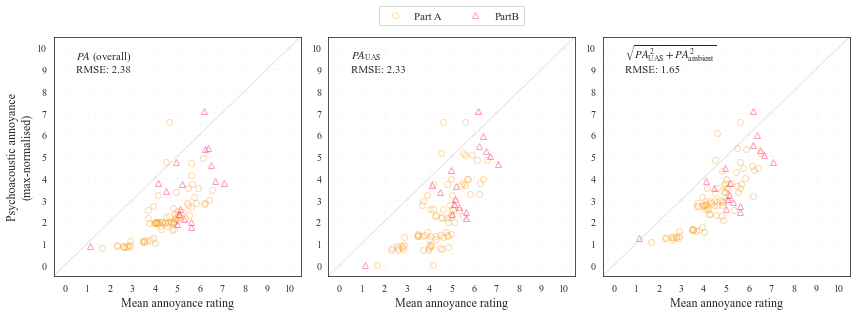

In [205]:
# plot results for Torija model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[4],
                 alpha=0.4)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[2],
                 alpha=0.4)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Torija_1", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")


    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PATorijaMean_1.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PATorijaMean_1.pdf"),
                format='pdf')

plt.show()


#### Widmann psychoacoustic annoyance with new input metrics

In [ ]:
inputSQMs = {'loudness' : 'LoudECMAPowAvgBin',
             'sharpness' : 'SharpAurISO305ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctECMA10ExMaxLR',
             'tonality' : None,
             'impulsivity' : None}

##### Part A

In [90]:
# calculate overall psychoacoustic annoyance
paPtAWidmann_2 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                            sharpness=dataByStimTestA[inputSQMs['sharpness']],
                            roughness=dataByStimTestA[inputSQMs['roughness']],
                            fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                            tonality=None,
                            impulsivity=None,
                            method='widmann')

panPtAWidmann_2 = pd.DataFrame(paPtAWidmann_2/paPtAWidmann_2.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [91]:
# calculate UAS only psychoacoustic annoyance
paPtAUASWidmann_2 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                               sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                               roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtAUASWidmann_2.fillna(0, inplace=True)

panPtAWidmann_2['UASMean'] = paPtAUASWidmann_2/paPtAUASWidmann_2.max()*dataByStimTestA['AnnoyMean'].max()

In [92]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbWidmann_2 = np.sqrt(paPtAUASWidmann_2**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                                 sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                                 roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                                 fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                                 tonality=None,
                                                                 impulsivity=None,
                                                                 method='widmann')**2)

panPtAWidmann_2['UASAmbMean'] = paPtAUASAmbWidmann_2/paPtAUASAmbWidmann_2.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [93]:
# calculate overall psychoacoustic annoyance
paPtBWidmann_2 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                            sharpness=dataByStimTestB[inputSQMs['sharpness']],
                            roughness=dataByStimTestB[inputSQMs['roughness']],
                            fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                            tonality=None,
                            impulsivity=None,
                            method='widmann')

panPtBWidmann_2 = pd.DataFrame(paPtBWidmann_2/paPtBWidmann_2.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [94]:
# calculate UAS only psychoacoustic annoyance
paPtBUASWidmann_2 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                               sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                               roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                               fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                               tonality=None,
                               impulsivity=None,
                               method='widmann')
paPtBUASWidmann_2.fillna(0, inplace=True)

panPtBWidmann_2['UASMean'] = paPtBUASWidmann_2/paPtBUASWidmann_2.max()*dataByStimTestB['AnnoyMean'].max()

In [95]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbWidmann_2 = np.sqrt(paPtBUASWidmann_2**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                                 sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                                 roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                                 fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                                 tonality=None,
                                                                 impulsivity=None,
                                                                 method='widmann')**2)

panPtBWidmann_2['UASAmbMean'] = paPtBUASAmbWidmann_2/paPtBUASAmbWidmann_2.max()*dataByStimTestB['AnnoyMean'].max()

In [96]:
datasetsAMean = [panPtAWidmann_2['OvallMean'], panPtAWidmann_2['UASMean'], panPtAWidmann_2['UASAmbMean']]
datasetsBMean = [panPtBWidmann_2['OvallMean'], panPtBWidmann_2['UASMean'], panPtBWidmann_2['UASAmbMean']]

##### Model error

In [97]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Widmann_2", paRMSEMean.columns[ii]] = RMSE

##### Plot results

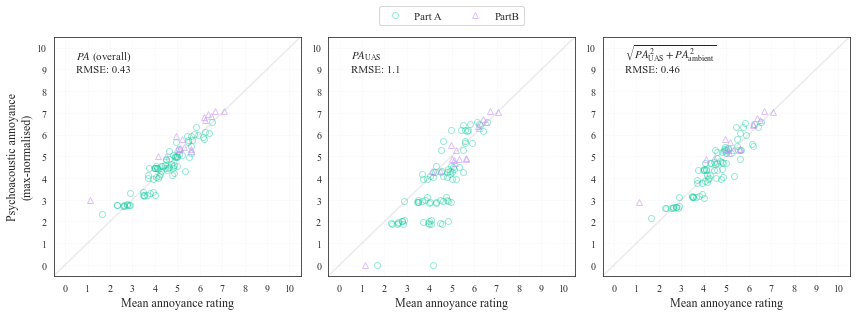

In [98]:
# plot results for Widmann model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[1],
                 alpha=0.4)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[5],
                 alpha=0.6)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Widmann_2", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")


    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PAWidmannMean_2.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PAWidmannMean_2.pdf"),
                format='pdf')

plt.show()


#### More psychoacoustic annoyance with new input metrics

In [ ]:
inputSQMs = {'loudness' : 'LoudECMAPowAvgBin',
             'sharpness' : 'SharpAurISO305ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctECMA10ExMaxLR',
             'tonality' : 'TonalSHMInt05ExMaxLR',
             'impulsivity' : None}

##### Part A

In [100]:
# calculate overall psychoacoustic annoyance
paPtAMore_2 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                         sharpness=dataByStimTestA[inputSQMs['sharpness']],
                         roughness=dataByStimTestA[inputSQMs['roughness']],
                         fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                         tonality=dataByStimTestA[inputSQMs['tonality']],
                         impulsivity=None,
                         method='more')

panPtAMore_2 = pd.DataFrame(paPtAMore_2/paPtAMore_2.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [101]:
# calculate UAS only psychoacoustic annoyance
paPtAUASMore_2 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                            sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                            roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                            fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                            tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                            impulsivity=None,
                            method='more')
paPtAUASMore_2.fillna(0, inplace=True)

panPtAMore_2['UASMean'] = paPtAUASMore_2/paPtAUASMore_2.max()*dataByStimTestA['AnnoyMean'].max()

In [102]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbMore_2 = np.sqrt(paPtAUASMore_2**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                           sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                           roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                           fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                           tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                           impulsivity=None,
                                                           method='more')**2)

panPtAMore_2['UASAmbMean'] = paPtAUASAmbMore_2/paPtAUASAmbMore_2.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [103]:
# calculate overall psychoacoustic annoyance
paPtBMore_2 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                         sharpness=dataByStimTestB[inputSQMs['sharpness']],
                         roughness=dataByStimTestB[inputSQMs['roughness']],
                         fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                         tonality=dataByStimTestB[inputSQMs['tonality']],
                         impulsivity=None,
                         method='more')

panPtBMore_2 = pd.DataFrame(paPtBMore_2/paPtBMore_2.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [104]:
# calculate UAS only psychoacoustic annoyance
paPtBUASMore_2 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                            sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                            roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                            fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                            tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                            impulsivity=None,
                            method='more')
paPtBUASMore_2.fillna(0, inplace=True)

panPtBMore_2['UASMean'] = paPtBUASMore_2/paPtBUASMore_2.max()*dataByStimTestB['AnnoyMean'].max()

In [107]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbMore_2 = np.sqrt(paPtBUASMore_2**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                           sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                           roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                           fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                           tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                           impulsivity=None,
                                                           method='more')**2)

panPtBMore_2['UASAmbMean'] = paPtBUASAmbMore_2/paPtBUASAmbMore_2.max()*dataByStimTestB['AnnoyMean'].max()

In [106]:
datasetsAMean = [panPtAMore_2['OvallMean'], panPtAMore_2['UASMean'], panPtAMore_2['UASAmbMean']]
datasetsBMean = [panPtBMore_2['OvallMean'], panPtBMore_2['UASMean'], panPtBMore_2['UASAmbMean']]


##### Model error

In [108]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["More_2", paRMSEMean.columns[ii]] = RMSE

##### Plot results

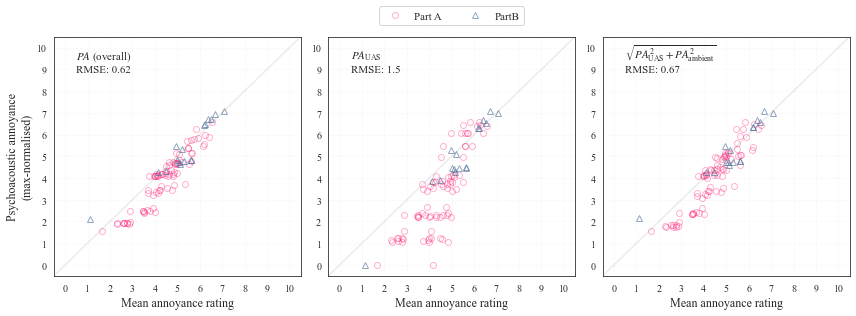

In [109]:
# plot results for More model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[2],
                 alpha=0.3)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[3],
                 alpha=0.6)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["More_2", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")


    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PAMoreMean_2.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PAMoreMean_2.pdf"),
                format='pdf')

plt.show()


#### Di psychoacoustic annoyance with new input metrics

In [ ]:
inputSQMs = {'loudness' : 'LoudECMAPowAvgBin',
             'sharpness' : 'SharpAurISO305ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctECMA10ExMaxLR',
             'tonality' : 'TonalSHMInt05ExMaxLR',
             'impulsivity' : None}

##### Part A

In [224]:
# calculate overall psychoacoustic annoyance
paPtADi_2 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                       sharpness=dataByStimTestA[inputSQMs['sharpness']],
                       roughness=dataByStimTestA[inputSQMs['roughness']],
                       fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                       tonality=dataByStimTestA[inputSQMs['tonality']],
                       impulsivity=None,
                       method='di')

panPtADi_2 = pd.DataFrame(paPtADi_2/paPtADi_2.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [225]:
# calculate UAS only psychoacoustic annoyance
paPtAUASDi_2 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                          sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                          roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                          fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                          tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                          impulsivity=None,
                          method='di')
paPtAUASDi_2.fillna(0, inplace=True)

panPtADi_2['UASMean'] = paPtAUASDi_2/paPtAUASDi_2.max()*dataByStimTestA['AnnoyMean'].max()

In [226]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbDi_2 = np.sqrt(paPtAUASDi_2**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                       sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                       roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                       fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                       tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                       impulsivity=None,
                                                       method='di')**2)

panPtADi_2['UASAmbMean'] = paPtAUASAmbDi_2/paPtAUASAmbDi_2.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [227]:
# calculate overall psychoacoustic annoyance
paPtBDi_2 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                       sharpness=dataByStimTestB[inputSQMs['sharpness']],
                       roughness=dataByStimTestB[inputSQMs['roughness']],
                       fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                       tonality=dataByStimTestB[inputSQMs['tonality']],
                       impulsivity=None,
                       method='di')

panPtBDi_2 = pd.DataFrame(paPtBDi_2/paPtBDi_2.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [228]:
# calculate UAS only psychoacoustic annoyance
paPtBUASDi_2 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                          sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                          roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                          fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                          tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                          impulsivity=None,
                          method='di')
paPtBUASDi_2.fillna(0, inplace=True)

panPtBDi_2['UASMean'] = paPtBUASDi_2/paPtBUASDi_2.max()*dataByStimTestB['AnnoyMean'].max()

In [229]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbDi_2 = np.sqrt(paPtBUASDi_2**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                       sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                       roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                       fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                       tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                       impulsivity=None,
                                                       method='di')**2)

panPtBDi_2['UASAmbMean'] = paPtBUASAmbDi_2/paPtBUASAmbDi_2.max()*dataByStimTestB['AnnoyMean'].max()

In [230]:
datasetsAMean = [panPtADi_2['OvallMean'], panPtADi_2['UASMean'], panPtADi_2['UASAmbMean']]
datasetsBMean = [panPtBDi_2['OvallMean'], panPtBDi_2['UASMean'], panPtBDi_2['UASAmbMean']]


##### Model error

In [231]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Di_2", paRMSEMean.columns[ii]] = RMSE

##### Plot results

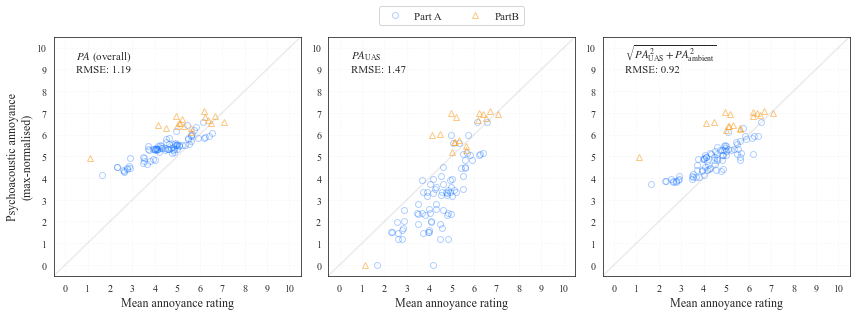

In [232]:
# plot results for Di model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[0],
                 alpha=0.3)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[4],
                 alpha=0.6)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Di_2", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")

    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PADiMean_2.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PADiMean_2.pdf"),
                format='pdf')

plt.show()


#### Torija psychoacoustic annoyance with new input metrics

In [ ]:
inputSQMs = {'loudness' : 'LoudECMAPowAvgBin',
             'sharpness' : 'SharpAurISO305ExMaxLR',
             'roughness' : 'RoughFZ05ExMaxLR',
             'fluctstr' : 'FluctECMA10ExMaxLR',
             'tonality' : 'TonalSHMInt05ExMaxLR',
             'impulsivity' : 'ImpulsSHMAvgMaxLR'}

##### Part A

In [207]:
# calculate overall psychoacoustic annoyance
paPtATorija_2 = psychAnnoy(loudness=dataByStimTestA[inputSQMs['loudness']],
                           sharpness=dataByStimTestA[inputSQMs['sharpness']],
                           roughness=dataByStimTestA[inputSQMs['roughness']],
                           fluctstr=dataByStimTestA[inputSQMs['fluctstr']],
                           tonality=dataByStimTestA[inputSQMs['tonality']],
                           impulsivity=dataByStimTestA[inputSQMs['impulsivity']],
                           method='torija')

panPtATorija_2 = pd.DataFrame(paPtATorija_2/paPtATorija_2.max()*dataByStimTestA['AnnoyMean'].max(), columns=['OvallMean'])

In [208]:
# calculate UAS only psychoacoustic annoyance
paPtAUASTorija_2 = psychAnnoy(loudness=dataByStimTestA["UAS" + inputSQMs['loudness']],
                              sharpness=dataByStimTestA["UAS" + inputSQMs['sharpness']],
                              roughness=dataByStimTestA["UAS" + inputSQMs['roughness']],
                              fluctstr=dataByStimTestA["UAS" + inputSQMs['fluctstr']],
                              tonality=dataByStimTestA["UAS" + inputSQMs['tonality']],
                              impulsivity=dataByStimTestA["UAS" + inputSQMs['impulsivity']],
                              method='torija')
paPtAUASTorija_2.fillna(0, inplace=True)

panPtATorija_2['UASMean'] = paPtAUASTorija_2/paPtAUASTorija_2.max()*dataByStimTestA['AnnoyMean'].max()

In [209]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtAUASAmbTorija_2 = np.sqrt(paPtAUASTorija_2**2 + psychAnnoy(loudness=dataByStimTestA["Amb" + inputSQMs['loudness']],
                                                               sharpness=dataByStimTestA["Amb" + inputSQMs['sharpness']],
                                                               roughness=dataByStimTestA["Amb" + inputSQMs['roughness']],
                                                               fluctstr=dataByStimTestA["Amb" + inputSQMs['fluctstr']],
                                                               tonality=dataByStimTestA["Amb" + inputSQMs['tonality']],
                                                               impulsivity=dataByStimTestA["Amb" + inputSQMs['impulsivity']],
                                                               method='torija')**2)

panPtATorija_2['UASAmbMean'] = paPtAUASAmbTorija_2/paPtAUASAmbTorija_2.max()*dataByStimTestA['AnnoyMean'].max()

##### Part B

In [210]:
# calculate overall psychoacoustic annoyance
paPtBTorija_2 = psychAnnoy(loudness=dataByStimTestB[inputSQMs['loudness']],
                           sharpness=dataByStimTestB[inputSQMs['sharpness']],
                           roughness=dataByStimTestB[inputSQMs['roughness']],
                           fluctstr=dataByStimTestB[inputSQMs['fluctstr']],
                           tonality=dataByStimTestB[inputSQMs['tonality']],
                           impulsivity=dataByStimTestB[inputSQMs['impulsivity']],
                           method='torija')

panPtBTorija_2 = pd.DataFrame(paPtBTorija_2/paPtBTorija_2.max()*dataByStimTestB['AnnoyMean'].max(), columns=['OvallMean'])

In [211]:
# calculate UAS only psychoacoustic annoyance
paPtBUASTorija_2 = psychAnnoy(loudness=dataByStimTestB["UAS" + inputSQMs['loudness']],
                              sharpness=dataByStimTestB["UAS" + inputSQMs['sharpness']],
                              roughness=dataByStimTestB["UAS" + inputSQMs['roughness']],
                              fluctstr=dataByStimTestB["UAS" + inputSQMs['fluctstr']],
                              tonality=dataByStimTestB["UAS" + inputSQMs['tonality']],
                              impulsivity=dataByStimTestB["UAS" + inputSQMs['impulsivity']],
                              method='torija')
paPtBUASTorija_2.fillna(0, inplace=True)

panPtBTorija_2['UASMean'] = paPtBUASTorija_2/paPtBUASTorija_2.max()*dataByStimTestB['AnnoyMean'].max()

In [212]:
# calculate combination of UAS and ambient psychoacoustic annoyance
paPtBUASAmbTorija_2 = np.sqrt(paPtBUASTorija_2**2 + psychAnnoy(loudness=dataByStimTestB["Amb" + inputSQMs['loudness']],
                                                               sharpness=dataByStimTestB["Amb" + inputSQMs['sharpness']],
                                                               roughness=dataByStimTestB["Amb" + inputSQMs['roughness']],
                                                               fluctstr=dataByStimTestB["Amb" + inputSQMs['fluctstr']],
                                                               tonality=dataByStimTestB["Amb" + inputSQMs['tonality']],
                                                               impulsivity=dataByStimTestB["Amb" + inputSQMs['impulsivity']],
                                                               method='torija')**2)

panPtBTorija_2['UASAmbMean'] = paPtBUASAmbTorija_2/paPtBUASAmbTorija_2.max()*dataByStimTestB['AnnoyMean'].max()

In [213]:
datasetsAMean = [panPtATorija_2['OvallMean'], panPtATorija_2['UASMean'], panPtATorija_2['UASAmbMean']]
datasetsBMean = [panPtBTorija_2['OvallMean'], panPtBTorija_2['UASMean'], panPtBTorija_2['UASAmbMean']]


##### Model error

In [214]:
# calculate RMSE

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    RMSE =  np.sqrt(np.square(pd.concat([datasetA, datasetB])
                              - pd.concat([dataByStimTestA['AnnoyMean'], dataByStimTestB['AnnoyMean']])).mean())

    paRMSEMean.loc["Torija_2", paRMSEMean.columns[ii]] = RMSE

##### Plot results

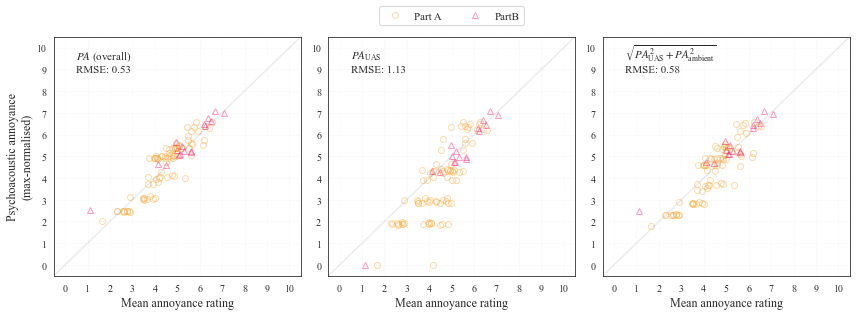

In [215]:
# plot results for Torija model

# mean
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5))

for ii, datasetA in enumerate(datasetsAMean):
    
    datasetB = datasetsBMean[ii]
    
    axs[ii].plot(dataByStimTestA['AnnoyMean'], datasetA, linestyle='None',
                 marker='o', markerfacecolor='None', markeredgecolor=mycolours[4],
                 alpha=0.4)
    
    axs[ii].plot(dataByStimTestB['AnnoyMean'], datasetB, linestyle='None',
                 marker='^', markerfacecolor='None', markeredgecolor=mycolours[2],
                 alpha=0.4)

    axs[ii].set(xticks=range(0, 11), xlim=[-0.5, 10.5],
                yticks=range(0, 11), ylim=[-0.5, 10.5],
                xlabel="Mean annoyance rating")

    axs[ii].plot(np.arange(-1, 12), np.arange(-1, 12), color=[0.25, 0.25, 0.25], alpha=0.1)
    
    axs[ii].grid(alpha=0.15, linestyle='--')

    axs[ii].text(0.5, 9.5, ["$\\it{PA}$ (overall)", "$\\it{PA}_\\text{UAS}$", "$\\sqrt{\\it{PA}_\\text{UAS}^2 + \\it{PA}_\\text{ambient}^2}$"][ii], fontsize=11)

    axs[ii].text(0.5, 8.85, "RMSE: " + roundTrad(paRMSEMean.loc["Torija_2", paRMSEMean.columns[ii]], 2).astype(str), fontsize=11)

    if ii == 0:
        axs[ii].set(ylabel="Psychoacoustic annoyance" + "\n"  +  "(max-normalised)")


    if ii == 1:
        axs[ii].legend(labels=['Part A', 'PartB'], bbox_to_anchor=(0.5, 1.15), loc='upper center', ncol=2, fontsize=11)

if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", "PATorijaMean_2.svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", "PATorijaMean_2.pdf"),
                format='pdf')

plt.show()


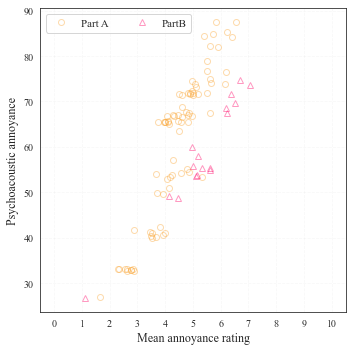

In [216]:
# plot results for Torija model

fig, ax = plt.subplots(figsize=(5, 5))
    
ax.plot(dataByStimTestA['AnnoyMean'], paPtATorija_2, linestyle='None',
             marker='o', markerfacecolor='None', markeredgecolor=mycolours[4],
             alpha=0.4)

ax.plot(dataByStimTestB['AnnoyMean'], paPtBTorija_2, linestyle='None',
             marker='^', markerfacecolor='None', markeredgecolor=mycolours[2],
             alpha=0.4)

ax.set(xticks=range(0, 11), xlim=[-0.5, 10.5],
            xlabel="Mean annoyance rating")

ax.grid(alpha=0.15, linestyle='--')

ax.set(ylabel="Psychoacoustic annoyance")


ax.legend(labels=['Part A', 'PartB'], ncol=2, fontsize=11)

plt.show()


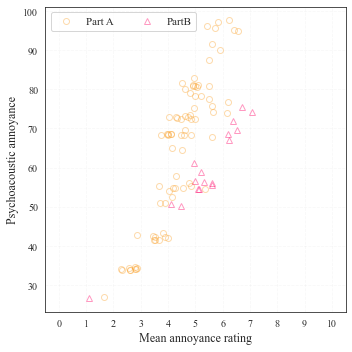

In [217]:
# plot results for Torija model

fig, ax = plt.subplots(figsize=(5, 5))
    
ax.plot(dataByStimTestA['AnnoyMean'], paPtAUASAmbTorija_2, linestyle='None',
             marker='o', markerfacecolor='None', markeredgecolor=mycolours[4],
             alpha=0.4)

ax.plot(dataByStimTestB['AnnoyMean'], paPtBUASAmbTorija_2, linestyle='None',
             marker='^', markerfacecolor='None', markeredgecolor=mycolours[2],
             alpha=0.4)

ax.set(xticks=range(0, 11), xlim=[-0.5, 10.5],
            xlabel="Mean annoyance rating")

ax.grid(alpha=0.15, linestyle='--')

ax.set(ylabel="Psychoacoustic annoyance")


ax.legend(labels=['Part A', 'PartB'], ncol=2, fontsize=11)

plt.show()


## Correlations between UAS SQMs

### Mean change in annoyance

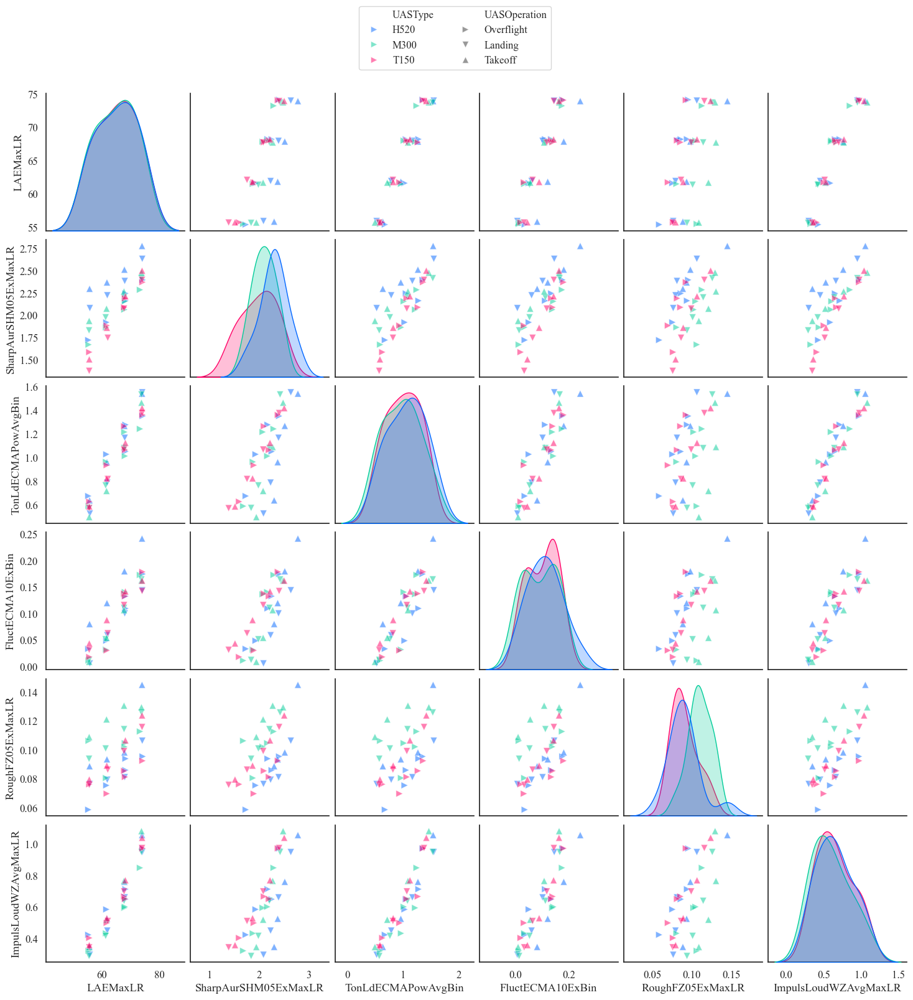

In [ ]:
# pairwise plots for absolute SQMs influencing mean change in annoyance
# using auxData to avoid data duplication, SQMs do not need 'UAS' prefix
metrics = ["LAEMaxLR", "SharpAurSHM05ExMaxLR", "TonLdECMAPowAvgBin",
           "FluctECMA10ExBin", "RoughFZ05ExMaxLR", "ImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': auxData['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=auxData.loc[auxData['SessionPart']=="A", :],
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)


sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtASQMdAnnoyPairwise"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


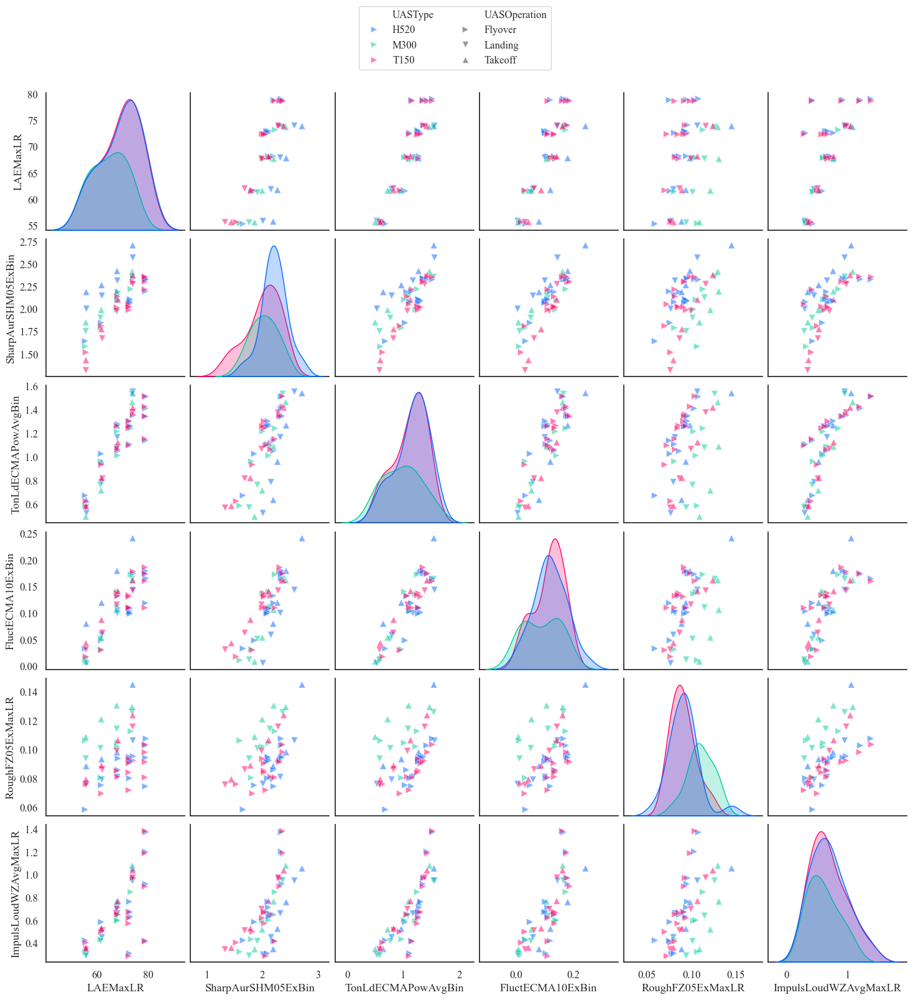

In [ ]:
# pairwise plots for absolute SQMs influencing mean change in annoyance
# using auxData to avoid data duplication, SQMs do not need 'UAS' prefix
metrics = ["LAEMaxLR", "SharpAurSHM05ExMaxLR", "TonLdECMAPowAvgBin",
           "FluctECMA10ExBin", "RoughFZ05ExMaxLR", "ImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': auxData['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=auxData,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABSQMdAnnoyPairwise"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


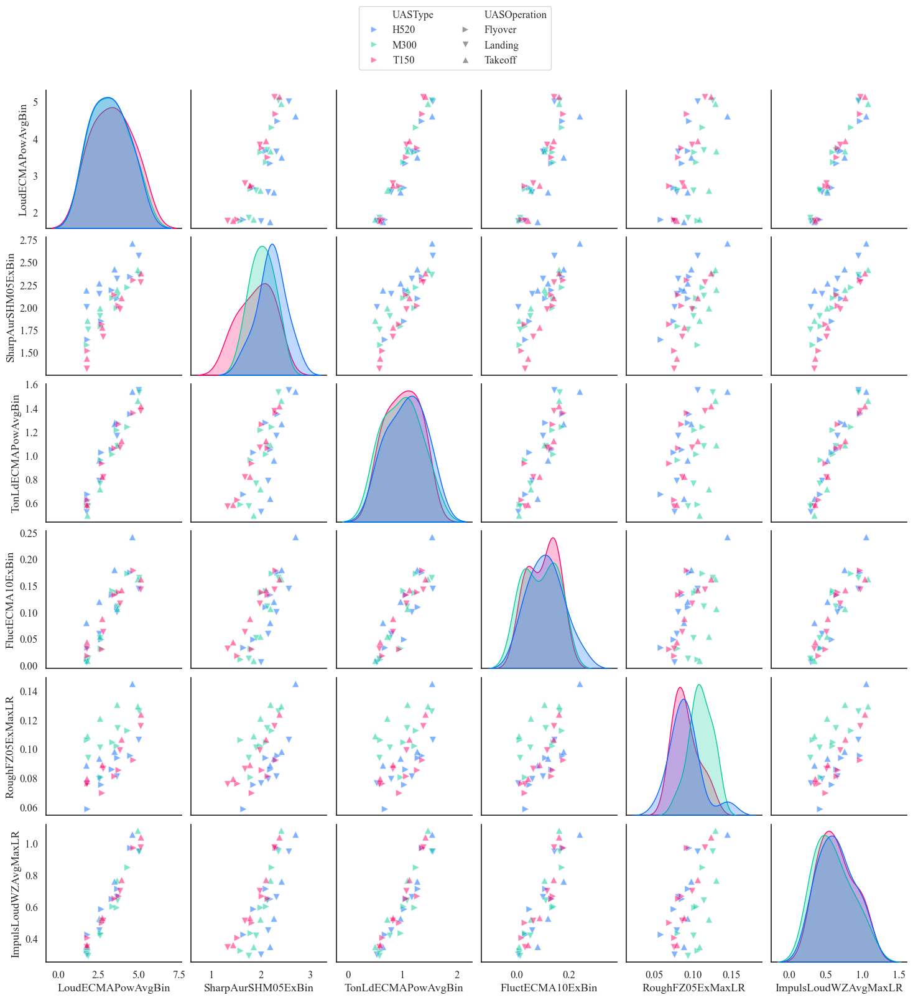

In [ ]:
# pairwise plots for absolute SQMs influencing mean change in annoyance
# using auxData to avoid data duplication, SQMs do not need 'UAS' prefix
metrics = ["LoudECMAPowAvgBin", "SharpAurSHM05ExMaxLR", "TonLdECMAPowAvgBin",
           "FluctECMA10ExBin", "RoughFZ05ExMaxLR", "ImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': auxData['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=auxData.loc[auxData['SessionPart']=="A", :],
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtASQMdAnnoyLoudPairwise"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)

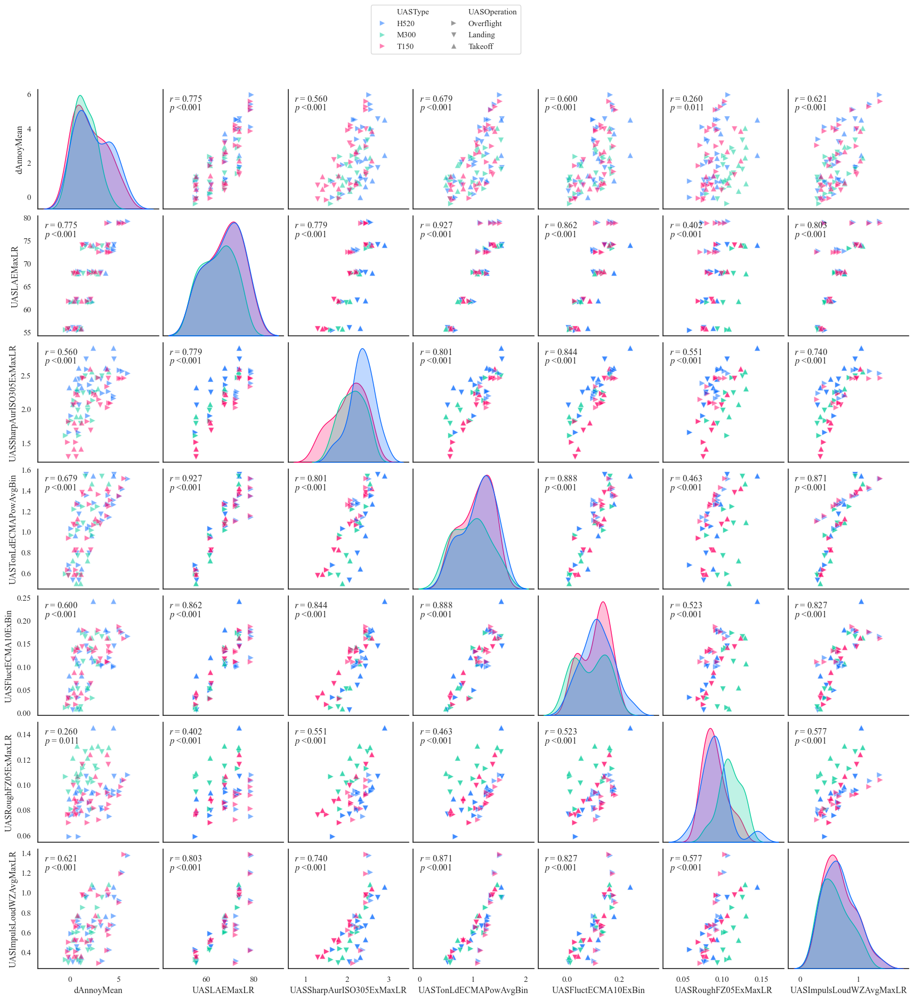

In [19]:
# pairwise plots for absolute SQMs influencing mean change in annoyance

# select only non-baseline conditions to avoid data duplication
data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]
# recategorise for plotting
for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

metrics = ["dAnnoyMean", "UASLAEMaxLR", "UASSharpAurISO305ExMaxLR", "UASTonLdECMAPowAvgBin",
           "UASFluctECMA10ExBin", "UASRoughFZ05ExMaxLR", "UASImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABSQMdAnnoyPairwiseResp"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


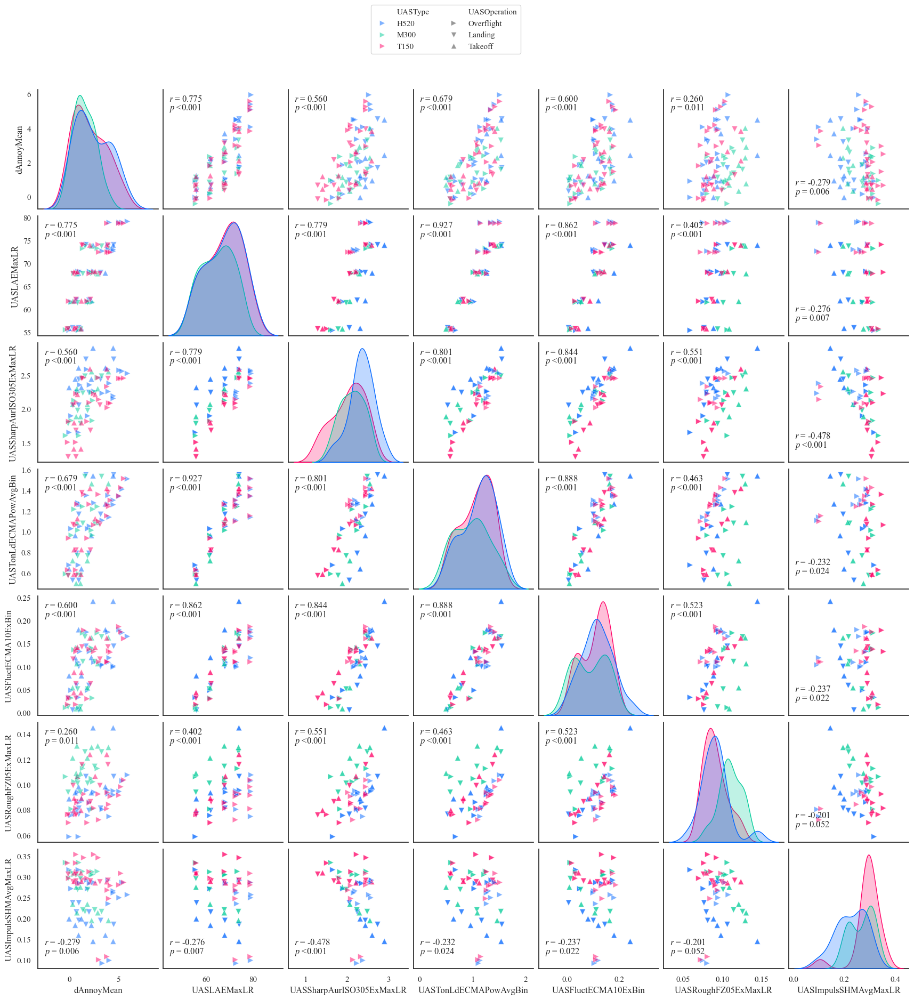

In [20]:
# pairwise plots for absolute SQMs influencing mean change in annoyance

# select only non-baseline conditions to avoid data duplication
data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]
# recategorise for plotting
for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

metrics = ["dAnnoyMean", "UASLAEMaxLR", "UASSharpAurISO305ExMaxLR", "UASTonLdECMAPowAvgBin",
           "UASFluctECMA10ExBin", "UASRoughFZ05ExMaxLR", "UASImpulsSHMAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABSQMdAnnoyPairwiseRespAltI"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


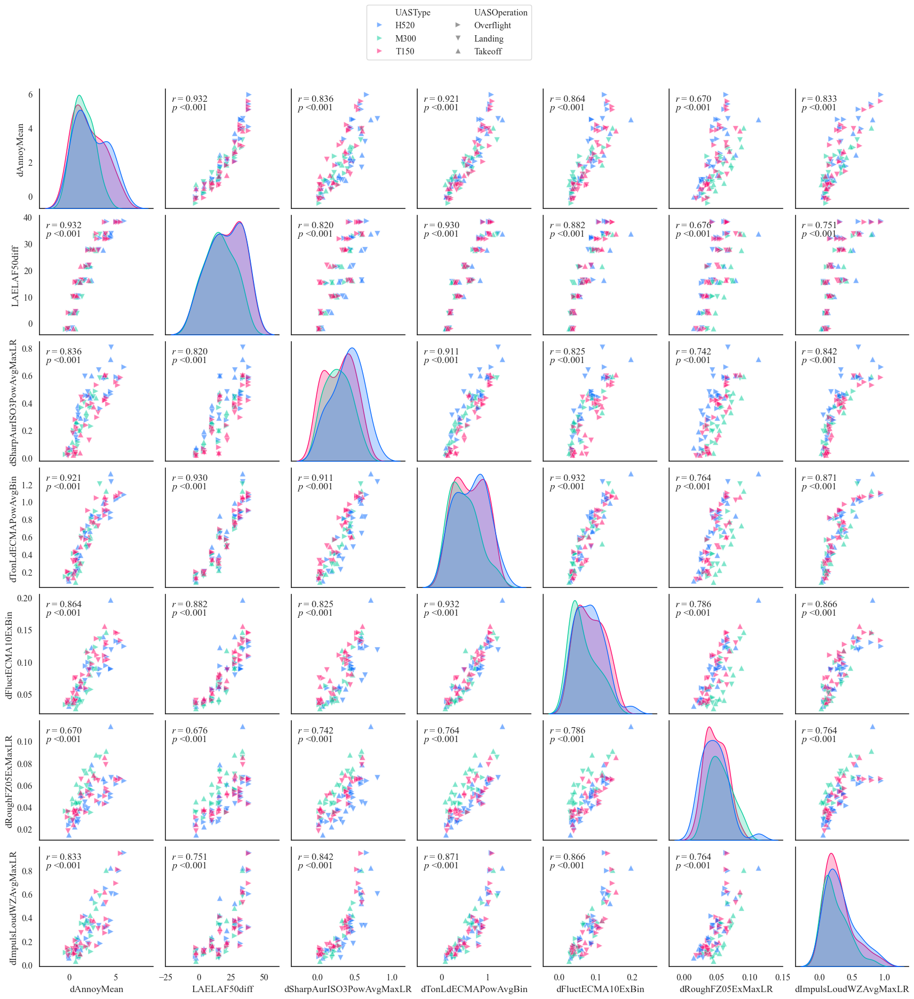

In [21]:
# pairwise plots for all SQMs influencing mean change in annoyance

# select only non-baseline conditions to avoid data duplication
data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]
# recategorise for plotting
for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

metrics = ["dAnnoyMean", "LAELAF50diff", "dSharpAurISO3PowAvgMaxLR", "dTonLdECMAPowAvgBin",
           "dFluctECMA10ExBin", "dRoughFZ05ExMaxLR", "dImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABAllSQMdAnnoyPairwiseResp"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


### Change in high annoyance

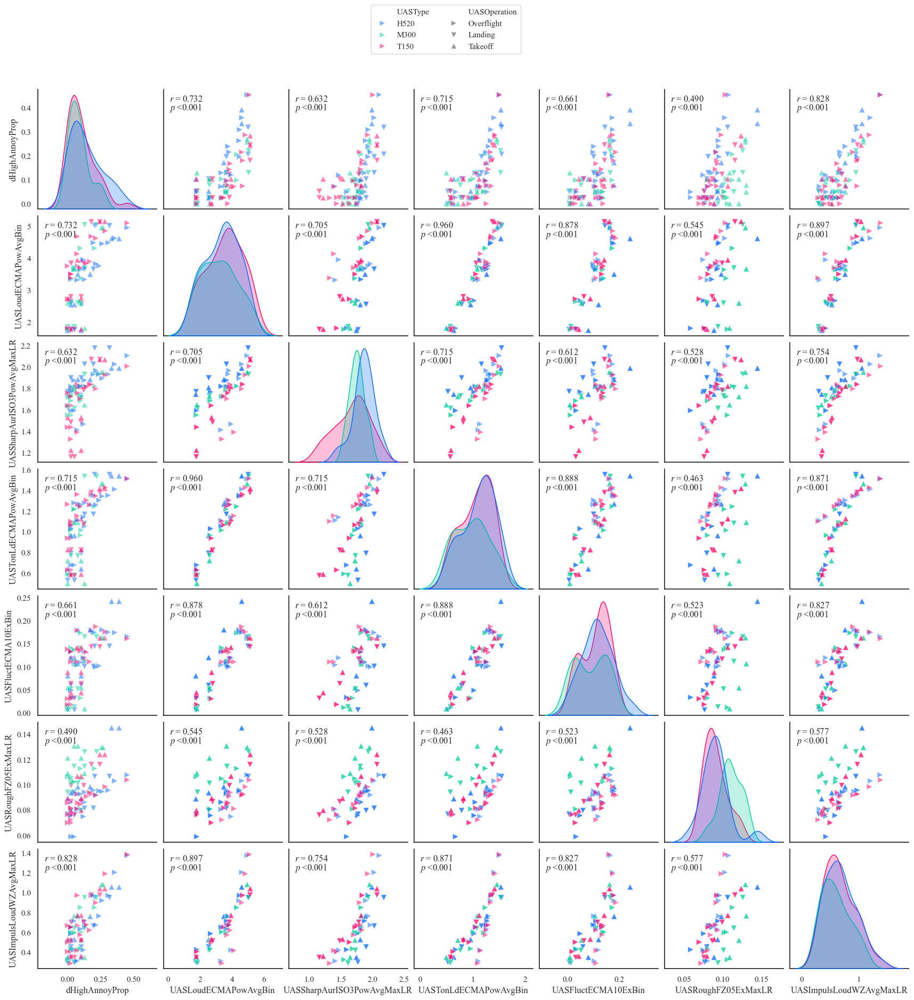

In [22]:
# pairwise plots for absolute SQMs influencing change in high annoyance

# select only non-baseline conditions to avoid data duplication
data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]
# recategorise for plotting
for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

metrics = ["dHighAnnoyProp", "UASLoudECMAPowAvgBin", "UASSharpAurISO3PowAvgMaxLR", "UASTonLdECMAPowAvgBin",
           "UASFluctECMA10ExBin", "UASRoughFZ05ExMaxLR", "UASImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABSQMdHiAnnoyPairwiseResp"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


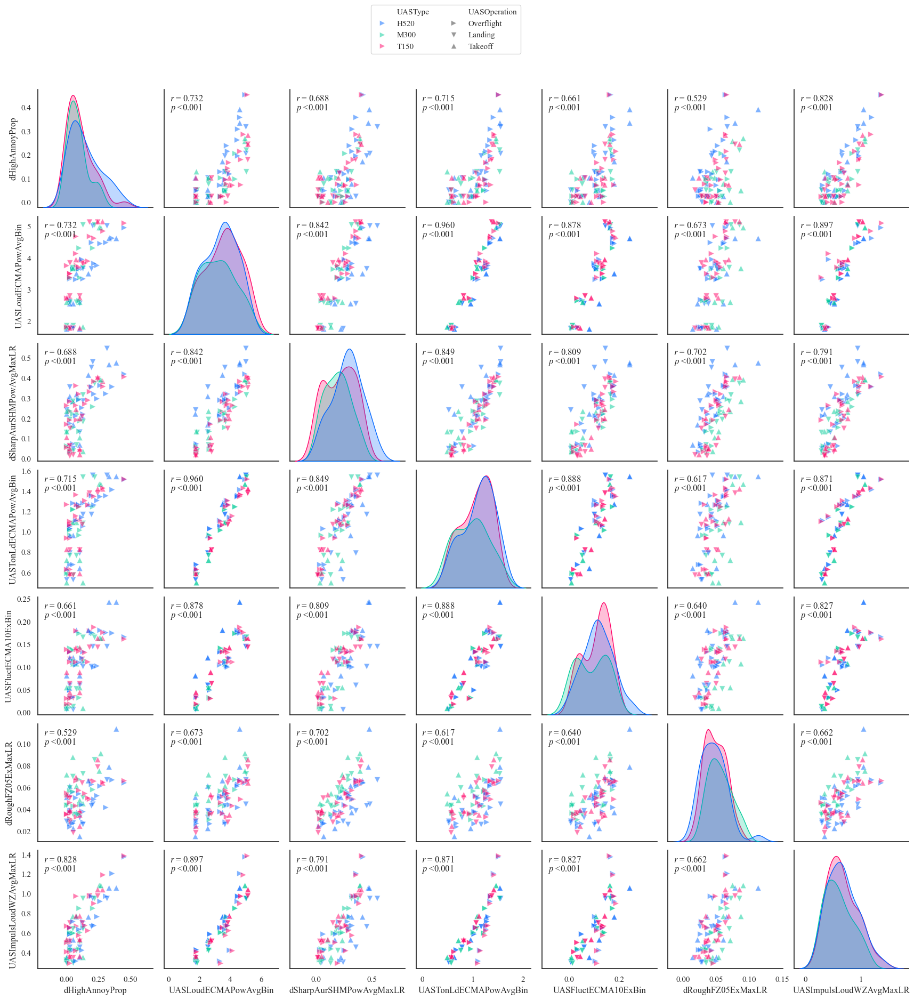

In [23]:
# pairwise plots for all SQMs influencing change in high annoyance

# select only non-baseline conditions to avoid data duplication
data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]
# recategorise for plotting
for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

metrics = ["dHighAnnoyProp", "UASLoudECMAPowAvgBin", "dSharpAurSHMPowAvgMaxLR", "UASTonLdECMAPowAvgBin",
           "UASFluctECMA10ExBin", "dRoughFZ05ExMaxLR", "UASImpulsLoudWZAvgMaxLR"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],  'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtsABAllSQMdHiAnnoyPairwiseResp"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)


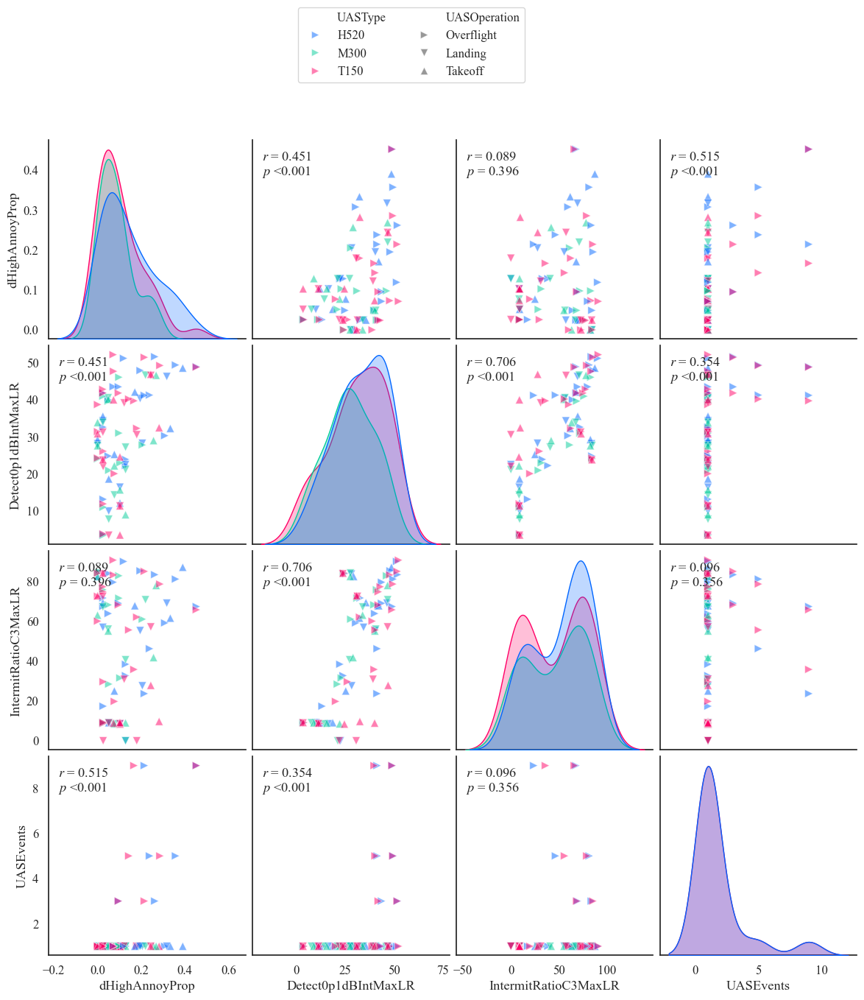

In [27]:
metrics = ["dHighAnnoyProp", "Detect0p1dBIntMaxLR", "IntermitRatioC3MaxLR", "UASEvents"]

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

data = dataByStimTest.loc[dataByStimTest['UASOperation'] != "Baseline", :]

for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],
               'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws, height=3)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.42, 1.14), title=None, frameon=True, ncols=2
)

filename = "PtsABEvtMetricsdHiAnnoyPairwiseResp"

if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')


sns.set_theme(style='white', font_scale=1)

### UAS noticed

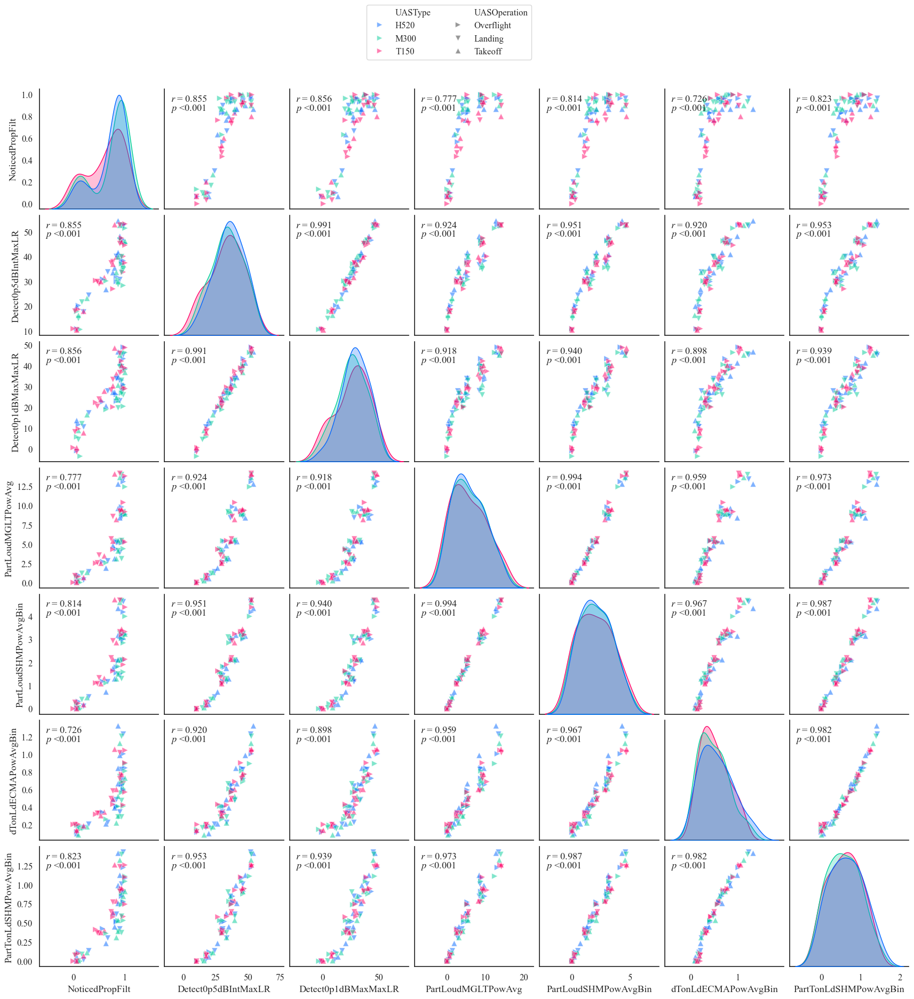

In [26]:
# pairwise plots for absolute SQMs influencing UAS noticed
metrics = ["NoticedPropFilt", "Detect0p5dBIntMaxLR", "Detect0p1dBMaxMaxLR", "PartLoudMGLTPowAvg",
           "PartLoudSHMPowAvgBin", "dTonLdECMAPowAvgBin", "PartTonLdSHMPowAvgBin"]

data = dataByStimTestANotice.loc[dataByStimTestANotice['UASOperation'] != "Baseline", :]

for dataset in [data]:
    dataset['AmbientEnv'] = pd.Categorical(dataset['AmbientEnv'], ["Park", "Street"], ordered=True)
    dataset['SNRlevel'] = pd.Categorical(dataset['SNRlevel'], ["-16", "-10", "-4", "2", "8"], ordered=True)
    dataset['UASLAeq'] = pd.Categorical(dataset['UASLAeq'], ["42", "48", "54", "60"], ordered=True)
    dataset['UASOperation'] = pd.Categorical(dataset['UASOperation'], ["Overflight", "Landing", "Takeoff"], ordered=True)
    dataset['UASType'] = pd.Categorical(dataset['UASType'], ["H520", "M300", "T150"], ordered=True)

map_to_marker = {'Takeoff': '^', 'Overflight': '>', 'Landing': 'v'}

scatter_kws = {'s': 60, 'alpha': 0.5, 'style': data['UASOperation'],
               'markers': map_to_marker}

sns.set_theme(style='white', font_scale=1.1, font='serif')

pplot = sns.pairplot(data=data,
                     hue="UASType", palette=mycolours[0:3], vars=metrics,
                     corner=False, plot_kws=scatter_kws)

pplot.map_lower(corr_pearson)
pplot.map_upper(corr_pearson)

sns.move_legend(
    pplot, loc="upper center", bbox_to_anchor=(0.45, 1.08), title=None, frameon=True, ncols=2
)

filename = "PtASQMNoticeDetectPairwise"
if saveplots:
    pplot.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                    format='svg')
    pplot.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                    format='pdf')

sns.set_theme(style='white', font_scale=1)


## Correlations between responses and metrics

### UAS noticed

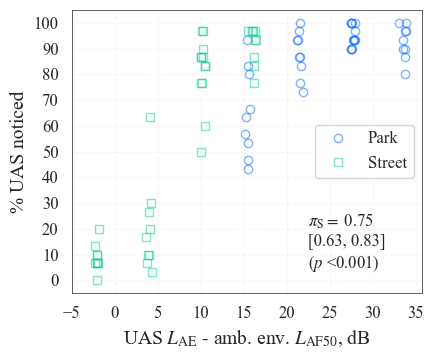

In [ ]:
# Generate scatter charts for noticeability and LAELAF50diff

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'LAELAF50diff'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2, floor=False)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'LAELAF50diff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'LAELAF50diff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS $L_\mathrm{AE}$ - amb. env. $L_\mathrm{AF50}$, dB",
       ylabel=r"% UAS noticed",
       xticks=np.arange(-5, 40, 5),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(22.5, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

if saveplots:
    filename = "PtANoticeLAELAF50diffByAmb"
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

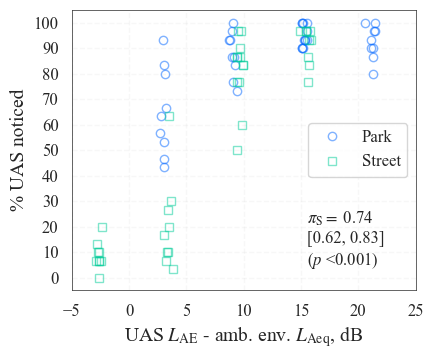

In [ ]:
# Generate scatter charts for noticeability and LAELAeq

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'LAELAeqdiff'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'LAELAeqdiff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'LAELAeqdiff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS $L_\mathrm{AE}$ - amb. env. $L_\mathrm{Aeq}$, dB",
       ylabel=r"% UAS noticed",
       xticks=np.arange(-5, 30, 5),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(15.5, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

plt.show()

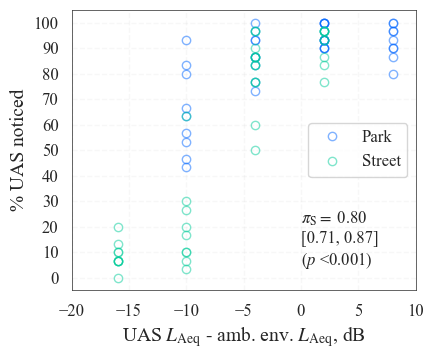

In [ ]:
# Generate scatter charts for noticeability and LAELAeq

# prepare data
data = dataByStimTestANotice.copy()
dictSNR = {0: "Baseline", 1: -16, 2: -10, 3: -4, 4: 2, 5: 8}
data['SNRlevel'].cat.codes.map(dictSNR)
data = data.loc[data['SNRlevel'] != "Baseline", :]
data['SNRlevel'] = pd.to_numeric(data['SNRlevel'])

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(data.loc[:, 'SNRlevel'],
                   data.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:
    equals = "="

ax.plot(data.loc[data['AmbientEnv']=="Park", 'SNRlevel'],
        data.loc[data['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(data.loc[data['AmbientEnv']=="Street", 'SNRlevel'],
        data.loc[data['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS $L_\mathrm{Aeq}$ - amb. env. $L_\mathrm{Aeq}$, dB",
       ylabel=r"% UAS noticed",
       xticks=np.arange(-20, 15, 5),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(0, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

if saveplots:
    filename = "PtANoticeSNRByAmb"
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

plt.show()

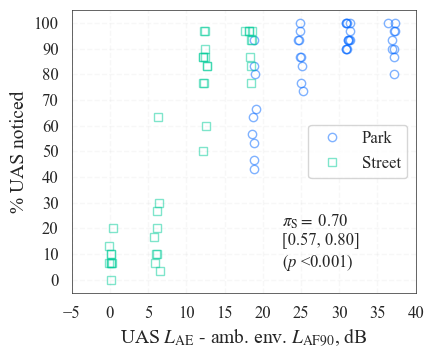

In [ ]:
# Generate scatter charts for noticeability and LAELAF90

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'LAELAF90diff'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'LAELAF90diff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'LAELAF90diff'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS $L_\mathrm{AE}$ - amb. env. $L_\mathrm{AF90}$, dB",
       ylabel=r"% UAS noticed",
       xticks=np.arange(-5, 45, 5),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(22.5, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

plt.show()

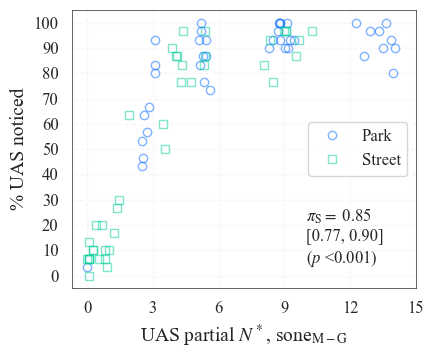

In [ ]:
# Generate scatter charts for noticeability and partial loudness

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'PartLoudMGSTPowAvg'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'PartLoudMGSTPowAvg'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'PartLoudMGSTPowAvg'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS partial $N^*$, sone$_{\mathrm{M-G}}$",
       ylabel=r"% UAS noticed",
       xticks=np.arange(0, 18, 3),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(10, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

if saveplots:
    filename = "PtANoticeVsPartLoudPowByAmbFilt"
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

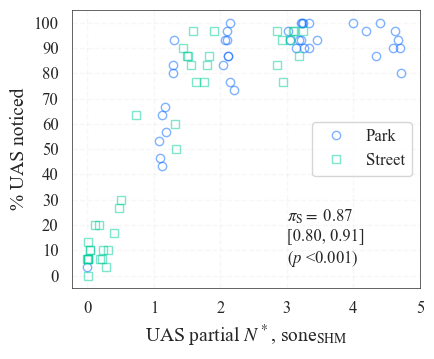

In [ ]:
# Generate scatter charts for noticeability and partial loudness (Sottek)

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'PartLoudSHMPowAvgBin'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'PartLoudSHMPowAvgBin'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'PartLoudSHMPowAvgBin'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS partial $N^*$, sone$_{\mathrm{SHM}}$",
       ylabel=r"% UAS noticed",
       xticks=np.arange(0, 6, 1),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(3, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2, False) + ", "
        + display_round(rCI[1], 2, False) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

if saveplots:
    filename = "PtANoticeVsPartLoudSHMPowAvgByAmbFilt"
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

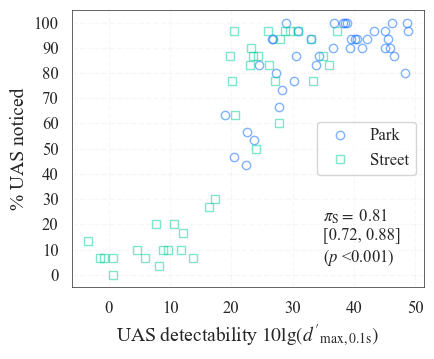

In [ ]:
# Generate scatter charts for noticeability and lg(detectability)

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'Detect0p1dBMaxMaxLR'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'Detect0p1dBMaxMaxLR'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Park", 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Park")

ax.plot(dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'Detect0p1dBMaxMaxLR'],
        dataByStimTestANotice.loc[dataByStimTestANotice['AmbientEnv']=="Street", 'NoticedPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5,
        label="Street")

ax.set(xlabel=r"UAS detectability $10\mathrm{lg}(d'_{\mathrm{max,0.1s}})$",
       ylabel=r"% UAS noticed",
       xticks=np.arange(0, 60, 10),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(35, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2, False) + ", "
        + display_round(rCI[1], 2, False) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')
ax.legend(loc='center right')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtANoticeDetectCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

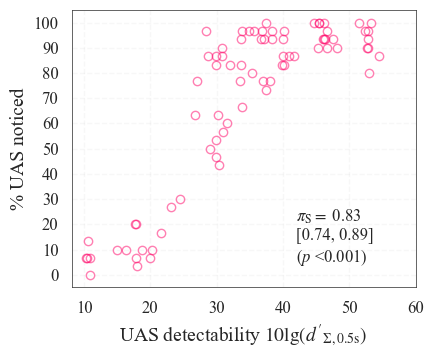

In [ ]:
# Generate scatter charts for noticeability and lg(detectability)

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'Detect0p5dBIntMaxLR'],
                   dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[:, 'Detect0p5dBIntMaxLR'],
        dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[2], markeredgewidth=1,
        color='none', alpha=0.5)

ax.set(xlabel=r"UAS detectability $10\mathrm{lg}(d'_{\mathrm{\Sigma,0.5s}})$",
       ylabel=r"% UAS noticed",
       xticks=np.arange(10, 70, 10),
       yticks=np.arange(0, 1.1, 0.1),
       yticklabels=np.arange(0, 110, 10))
ax.text(42, 0.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtANoticeDetectCorr"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
plt.show()

### Annoyance

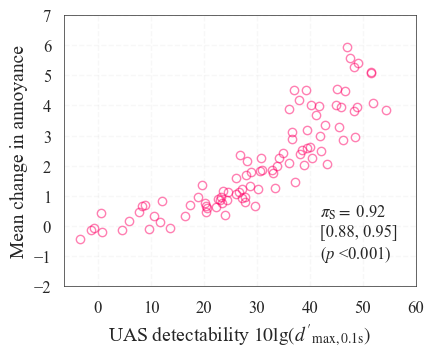

In [ ]:
# Generate scatter charts for mean change in annoyance and lg(detectability)

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTest.loc[:, 'Detect0p1dBMaxMaxLR'],
                   dataByStimTest.loc[:, 'dAnnoyMean'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[:, 'Detect0p1dBMaxMaxLR'],
        dataByStimTest.loc[:, 'dAnnoyMean'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[2], markeredgewidth=1,
        color='none', alpha=0.5)

ax.set(xlabel=r"UAS detectability $10\mathrm{lg}(d'_{\mathrm{max,0.1s}})$",
       ylabel=r"Mean change in annoyance",
       xticks=np.arange(0, 70, 10),
       yticks=np.arange(-2, 8, 1))
ax.text(42, -1.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

plt.show()

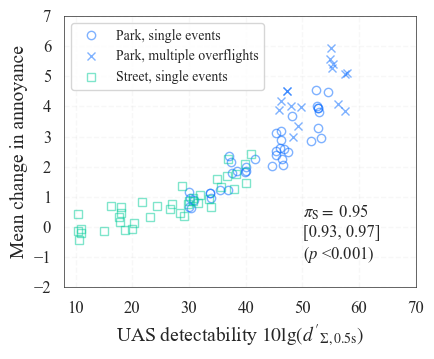

In [ ]:
# Generate scatter charts for mean change in annoyance and lg(detectability), separated colours

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTest.loc[:, 'Detect0p5dBIntMaxLR'],
                   dataByStimTest.loc[:, 'dAnnoyMean'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dAnnoyMean'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS detectability $10\mathrm{lg}(d'_{\mathrm{\Sigma,0.5s}})$",
       ylabel=r"Mean change in annoyance",
       xticks=np.arange(10, 80, 10),
       yticks=np.arange(-2, 8, 1))
ax.text(50.2, -1.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2, floor=False) + ", "
        + display_round(rCI[1], 2, floor=False) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdAnnoyMnDetectCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
plt.show()

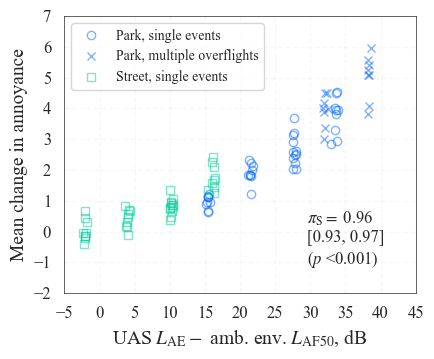

In [ ]:
# Generate scatter charts for mean change in annoyance and LAELAF50diff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'LAELAF50diff'],
                   dataByStimTest.loc[:, 'dAnnoyMean'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dAnnoyMean'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AE}-$ amb. env. $L_\mathrm{AF50}$, dB",
       ylabel=r"Mean change in annoyance",
       xticks=np.arange(-5, 50, 5),
       yticks=np.arange(-2, 8, 1))
ax.text(29.5, -1.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdAnnoyMndLAECorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

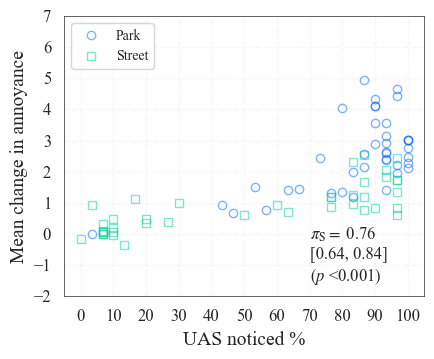

In [ ]:
# Generate scatter charts for mean change in annoyance and noticeability, separated colours

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   dataByStimTestANotice.loc[:, 'dAnnoyMeanFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Park")
                           & (dataByStimTestANotice['SessionPart']=="A"), 'NoticedPropFilt'],
        dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Park")
                           & (dataByStimTestANotice['SessionPart']=="A"), 'dAnnoyMeanFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park")

ax.plot(dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Street")
                           & (dataByStimTestANotice['SessionPart']=="A"), 'NoticedPropFilt'],
        dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Street")
                           & (dataByStimTestANotice['SessionPart']=="A"), 'dAnnoyMeanFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street")

ax.set(xlabel=r"UAS noticed %",
       ylabel=r"Mean change in annoyance",
       xticks=np.arange(0, 1.1, 0.1),
       xticklabels=np.arange(0, 110, 10),
       yticks=np.arange(-2, 8, 1))
ax.text(0.7, -1.5, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtAdAnnoyMnNoticeCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
plt.show()

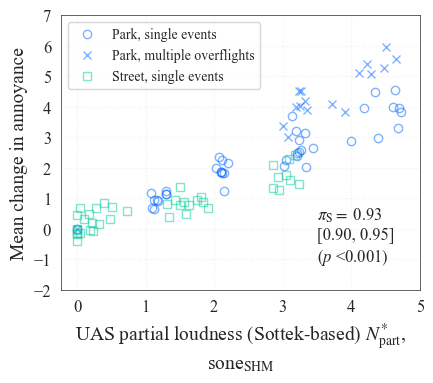

In [13]:
# Generate scatter charts for mean change in annoyance and partial loudness, separated colours

fig, ax = plt.subplots(figsize=(4.5, 4))

testCorr = pg.corr(dataByStimTest.loc[:, 'PartLoudSHMPowAvgBin'],
                   dataByStimTest.loc[:, 'dAnnoyMean'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dAnnoyMean'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dAnnoyMean'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS partial loudness (Sottek-based) $N^{*}_\mathrm{part}$," + "\n" + "sone$_\mathrm{SHM}$",
       ylabel=r"Mean change in annoyance",
       xticks=np.arange(0, 6, 1),
       yticks=np.arange(-2, 8, 1))
ax.text(3.5, -1.05, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2, floor=False) + ", "
        + display_round(rCI[1], 2, floor=False) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdAnnoyMnPartLoudCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
plt.show()

### % Highly annoyed | HA'amb

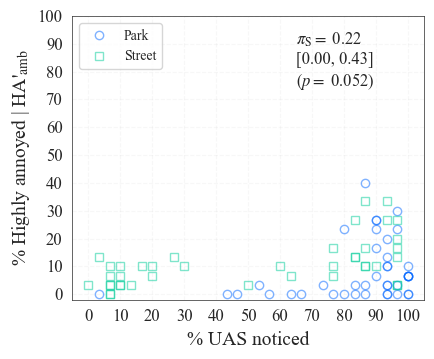

In [12]:
# Generate scatter charts for % highly annoyed and % UAS noticed

fig, ax = plt.subplots(figsize=(4.5, 3.75))

testCorr = pg.corr(dataByStimTestANotice.loc[:, 'NoticedPropFilt'],
                   dataByStimTestANotice.loc[:, 'dHighAnnoyPropFilt'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Park")
                                  & (dataByStimTestANotice['SessionPart']=="A"), 'NoticedPropFilt'],
        dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Park")
                                  & (dataByStimTestANotice['SessionPart']=="A"), 'dHighAnnoyPropFilt'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park")

ax.plot(dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Street")
                                  & (dataByStimTestANotice['SessionPart']=="A"), 'NoticedPropFilt'],
        dataByStimTestANotice.loc[(dataByStimTestANotice['AmbientEnv']=="Street")
                                  & (dataByStimTestANotice['SessionPart']=="A"), 'dHighAnnoyPropFilt'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street")

ax.set(xlabel=r"% UAS noticed",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 1.1, 0.1), xticklabels=np.arange(0, 110, 10),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(0.65, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2, floor=False) + ", "
        + display_round(rCI[1], 2, floor=False) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtAdHiAnnoyUASNoticedCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

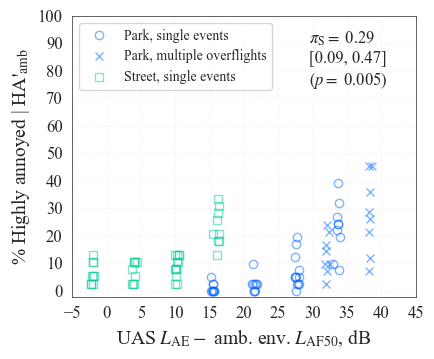

In [14]:
# Generate scatter charts for % highly annoyed and LAELAF50diff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'LAELAF50diff'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAF50diff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AE}-$ amb. env. $L_\mathrm{AF50}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-5, 50, 5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(29.5, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLAELAF50diffCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

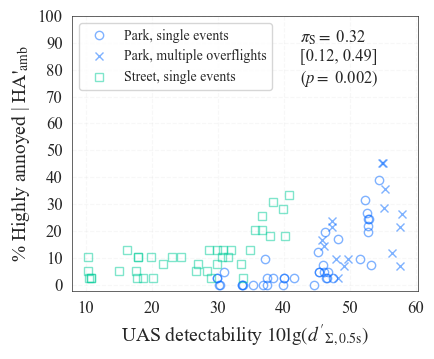

In [16]:
# Generate scatter charts for % highly annoyed and Detect0p5dBIntMaxLR

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'Detect0p5dBIntMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'Detect0p5dBIntMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS detectability $10\mathrm{lg}(d'_{\mathrm{\Sigma,0.5s}})$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(10, 70, 10),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(42.5, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyDetect0p5IntCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

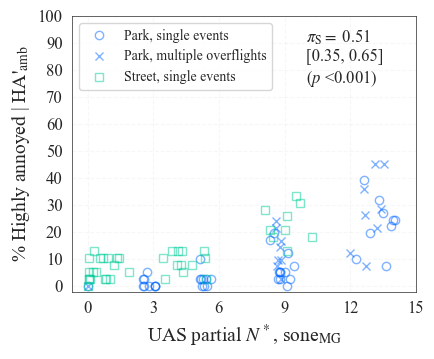

In [17]:
# Generate scatter charts for % highly annoyed and PartLoudMGSTPowAvg

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'PartLoudMGSTPowAvg'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudMGSTPowAvg'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'PartLoudMGSTPowAvg'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudMGSTPowAvg'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS partial $N^*$, sone$_{\mathrm{MG}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 18, 3),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(10, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyPartLoudMGSTPowAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

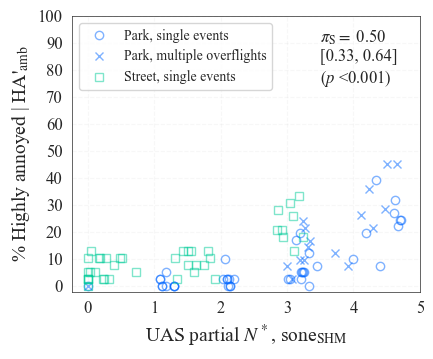

In [18]:
# Generate scatter charts for % highly annoyed and PartLoudSHMPowAvg

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'PartLoudSHMPowAvgBin'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'PartLoudSHMPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS partial $N^*$, sone$_{\mathrm{SHM}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 6, 1),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(3.5, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyPartLoudSHMPowAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

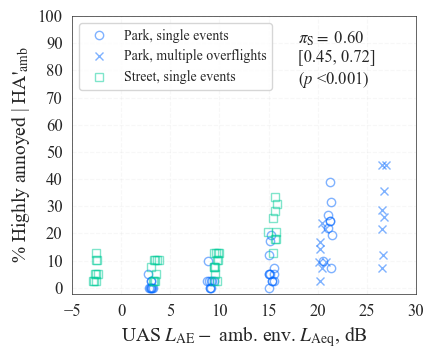

In [19]:
# Generate scatter charts for % highly annoyed and LAELAeqdiff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'LAELAeqdiff'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAeqdiff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'LAELAeqdiff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'LAELAeqdiff'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AE} -$ amb. env. $L_\mathrm{Aeq}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-5, 35, 5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(18, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLAELAeqdiffCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

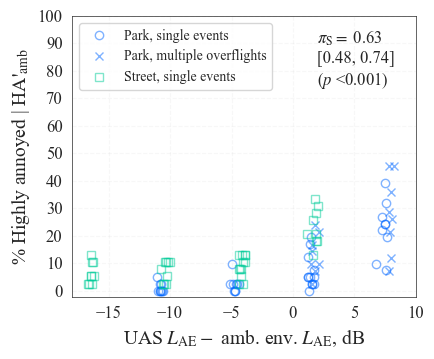

In [20]:
# Generate scatter charts for % highly annoyed and LAELAEdiff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASLAEMaxLR'] - dataByStimTest.loc[:, 'AmbLAEMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAEMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASLAEMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="B"), 'AmbLAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAEMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AE} -$ amb. env. $L_\mathrm{AE}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-15, 15, 5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(2, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLAELAEdiffCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

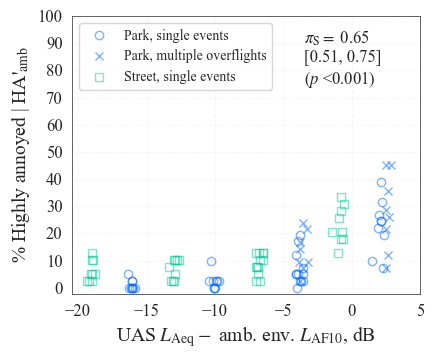

In [21]:
# Generate scatter charts for % highly annoyed and LAeqLAF10diff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASLAeqMaxLR'] - dataByStimTest.loc[:, 'AmbLAF10ExMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAeqMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASLAeqMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="B"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAeqMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{Aeq} -$ amb. env. $L_\mathrm{AF10}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-20, 10, 5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(-3.5, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLAeqLAF10diffCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

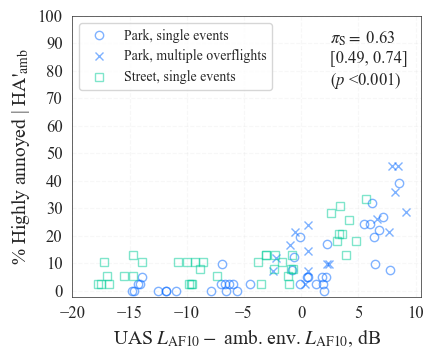

In [22]:
# Generate scatter charts for % highly annoyed and LAF10LAF10diff

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASLAF10ExMaxLR'] - dataByStimTest.loc[:, 'AmbLAF10ExMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAF10ExMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASLAF10ExMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                              & (dataByStimTest['SessionPart']=="B"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLAF10ExMaxLR']
        - dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                              & (dataByStimTest['SessionPart']=="A"), 'AmbLAF10ExMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AF10} -$ amb. env. $L_\mathrm{AF10}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-20, 15, 5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(2.5, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLAF10LAF10diffCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')

plt.show()

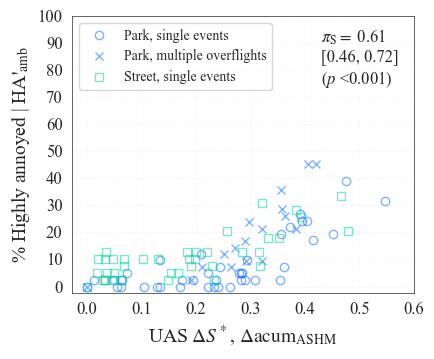

In [23]:
# Generate scatter charts for % highly annoyed and dSharpAurSHMPowAvgMaxLR

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'dSharpAurSHMPowAvgMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dSharpAurSHMPowAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dSharpAurSHMPowAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dSharpAurSHMPowAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $\Delta S^*$, $\Delta\mathrm{acum_{ASHM}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 0.7, 0.1),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(0.43, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoydSharpAurSHMPowAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

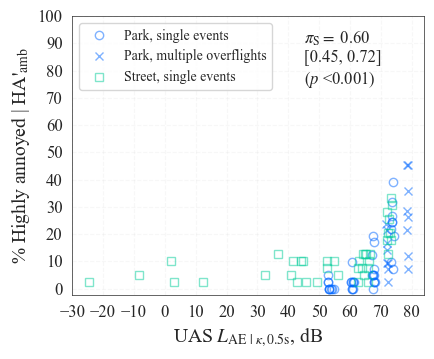

In [24]:
# Generate scatter charts for % highly annoyed and UASDisc0p5LAEMaxLR

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASDisc0p5LAEMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASDisc0p5LAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASDisc0p5LAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASDisc0p5LAEMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS $L_\mathrm{AE\ |\ \mathit{\kappa},0.5s}$, dB",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(-30, 90, 10),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(45, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyUASDisc0p5LAEMaxLRCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

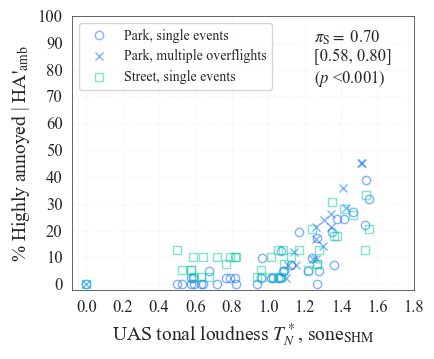

In [25]:
# Generate scatter charts for % highly annoyed and UASTonLdECMAPowAvgBin

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASTonLdECMAPowAvgBin'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASTonLdECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASTonLdECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASTonLdECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS tonal loudness $T_{N}^*$, sone$_{\mathrm{SHM}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 2, 0.2),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(1.25, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyTonLdECMAPowAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

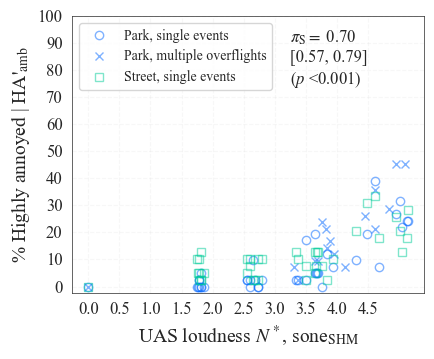

In [26]:
# Generate scatter charts for % highly annoyed and UASLoudECMAPowAvgBin

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASLoudECMAPowAvgBin'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLoudECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASLoudECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASLoudECMAPowAvgBin'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS loudness $N^*$, sone$_{\mathrm{SHM}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 5, 0.5),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(3.25, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyLoudECMAPowAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

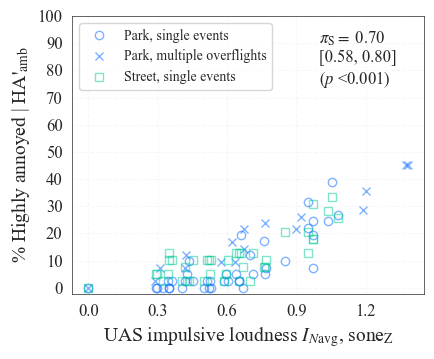

In [27]:
# Generate scatter charts for % highly annoyed and UASImpulsLoudWZAvgMaxLR

fig, ax = plt.subplots(figsize=(4.5, 3.75))


testCorr = pg.corr(dataByStimTest.loc[:, 'UASImpulsLoudWZAvgMaxLR'],
                   dataByStimTest.loc[:, 'dHighAnnoyProp'],
                   method='shepherd',
                   n_boot=10000)

rVal = display_round(testCorr['r'].iloc[0], 2)
pVal = display_round(testCorr['p_val'].iloc[0], 3)
rCI = testCorr['CI95'].iloc[0]

if testCorr['p_val'].iloc[0] < 0.001:
    equals = ""
else:    
    equals = "="

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'UASImpulsLoudWZAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='o', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, single events")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'UASImpulsLoudWZAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Park")
                           & (dataByStimTest['SessionPart']=="B"), 'dHighAnnoyProp'],
        marker='x', markerfacecolor='none', markeredgecolor=mycolours[0], markeredgewidth=1,
        color='none', alpha=0.5, label="Park, multiple overflights")

ax.plot(dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'UASImpulsLoudWZAvgMaxLR'],
        dataByStimTest.loc[(dataByStimTest['AmbientEnv']=="Street")
                           & (dataByStimTest['SessionPart']=="A"), 'dHighAnnoyProp'],
        marker='s', markerfacecolor='none', markeredgecolor=mycolours[1], markeredgewidth=1,
        color='none', alpha=0.5, label="Street, single events")

ax.set(xlabel=r"UAS impulsive loudness $I_{N\mathrm{avg}}$, sone$_{\mathrm{Z}}$",
       ylabel=r"% Highly annoyed | HA'$_\mathrm{amb}$",
       xticks=np.arange(0, 1.5, 0.3),
       yticks=np.arange(0, 1.1, 0.1), yticklabels=np.arange(0, 110, 10))
ax.text(1.0, 0.75, r"$\pi_\mathrm{S}=$ " + rVal
        + "\n" + "[" + display_round(rCI[0], 2) + ", "
        + display_round(rCI[1], 2) + "]"
        + "\n" + "(" + "$p" + equals + "$ " + pVal + ")")
ax.grid(which='both', alpha=0.15, linestyle='--')

ax.legend(loc='upper left', fontsize=10)

for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(0.5)

filename = "PtsABdHiAnnoyImpulsLoudWZAvgCorrByAmb"
if saveplots:
    plt.savefig(os.path.join(outFigPath, "svg", filename + ".svg"),
                format='svg')
    plt.savefig(os.path.join(outFigPath, "pdf", filename + ".pdf"),
                format='pdf')
    
plt.show()

## Time-dependent

### Loudness

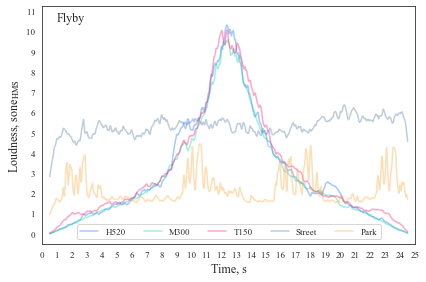

In [26]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet1'].iloc[13, 1:]
    # left channel
    specLoudnessHMSL = pd.DataFrame(workbookdata['Sheet1'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet1'].iloc[13, 1:],
                                    index=workbookdata['Sheet1'].iloc[14:, 0])
    # # right channel
    specLoudnessHMSR = pd.DataFrame(workbookdata['Sheet2'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet2'].iloc[13, 1:],
                                    index=workbookdata['Sheet2'].iloc[14:, 0])
    # # binaural specific loudness (ECMA-418-2:2022 Equation 118)
    specLoudnessHMSBin = ((specLoudnessHMSL**2
                           + specLoudnessHMSR**2)/2).pow(1/2)
    # # binaural time-dependent loudness (ECMA-418-2:2022 Equation 116)
    loudnessHMSTimeVar = specLoudnessHMSBin.sum(axis=0)*0.5

    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], loudnessHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=range(0, 12), xlim=[0, 25], ylim=[-0.5, 11.25],
       xlabel="Time, s", ylabel=r"Loudness, sone$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=1, y=10.5, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtALoudtDepFlyby.svg"), format='svg')
plt.show()

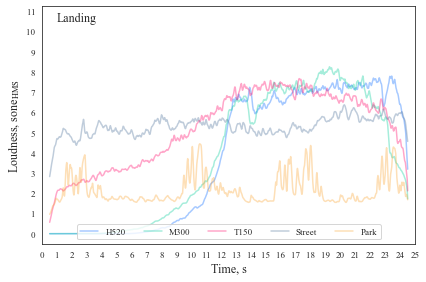

In [27]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet1'].iloc[13, 1:]
    # left channel
    specLoudnessHMSL = pd.DataFrame(workbookdata['Sheet1'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet1'].iloc[13, 1:],
                                    index=workbookdata['Sheet1'].iloc[14:, 0])
    # # right channel
    specLoudnessHMSR = pd.DataFrame(workbookdata['Sheet2'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet2'].iloc[13, 1:],
                                    index=workbookdata['Sheet2'].iloc[14:, 0])
    # # binaural specific loudness (ECMA-418-2:2022 Equation 118)
    specLoudnessHMSBin = ((specLoudnessHMSL**2
                           + specLoudnessHMSR**2)/2).pow(1/2)
    # # binaural time-dependent loudness (ECMA-418-2:2022 Equation 116)
    loudnessHMSTimeVar = specLoudnessHMSBin.sum(axis=0)*0.5

    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], loudnessHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=range(0, 12), xlim=[0, 25], ylim=[-0.5, 11.25],
       xlabel="Time, s", ylabel=r"Loudness, sone$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=1, y=10.5, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtALoudtDepLanding.svg"), format='svg')
plt.show()

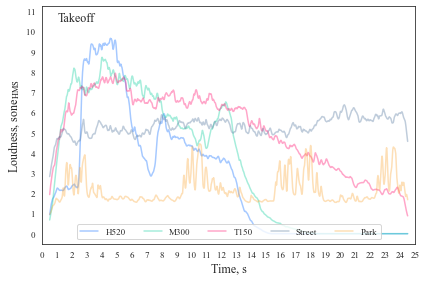

In [28]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet1'].iloc[13, 1:]
    # left channel
    specLoudnessHMSL = pd.DataFrame(workbookdata['Sheet1'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet1'].iloc[13, 1:],
                                    index=workbookdata['Sheet1'].iloc[14:, 0])
    # # right channel
    specLoudnessHMSR = pd.DataFrame(workbookdata['Sheet2'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet2'].iloc[13, 1:],
                                    index=workbookdata['Sheet2'].iloc[14:, 0])
    # # binaural specific loudness (ECMA-418-2:2022 Equation 118)
    specLoudnessHMSBin = ((specLoudnessHMSL**2
                           + specLoudnessHMSR**2)/2).pow(1/2)
    # # binaural time-dependent loudness (ECMA-418-2:2022 Equation 116)
    loudnessHMSTimeVar = specLoudnessHMSBin.sum(axis=0)*0.5

    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], loudnessHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=range(0, 12), xlim=[0, 25], ylim=[-0.5, 11.25],
       xlabel="Time, s", ylabel=r"Loudness, sone$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=1, y=10.5, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtALoudtDepTakeoff.svg"), format='svg')
plt.show()

### Sharpness

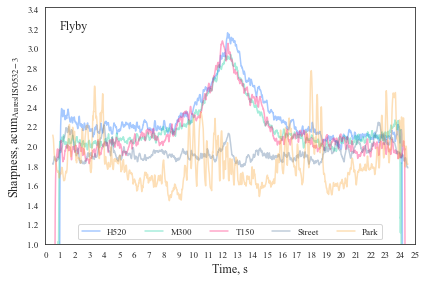

In [29]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet10'].iloc[13:, 0]
    sharpAISO3TimeVar2 = pd.DataFrame(workbookdata['Sheet10'].iloc[13:, 1:3].values,
                                     columns=workbookdata['Sheet10'].iloc[12, 1:3],
                                     index=workbookdata['Sheet10'].iloc[13:, 0])

    whichLR = np.argmax(sharpAISO3TimeVar2.mean(axis=0))
    sharpAISO3TimeVar = sharpAISO3TimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], sharpAISO3TimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(1, 4, 0.2), xlim=[0, 25], ylim=[1, 3.425],
       xlabel="Time, s", ylabel=r"Sharpness, acum$_\text{Aures|ISO532-3}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=1, y=3.2, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtASharptDepFlyby.svg"), format='svg')
plt.show()

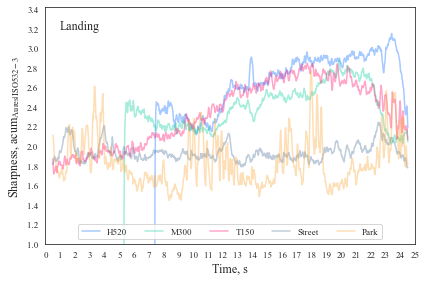

In [30]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet10'].iloc[13:, 0]
    sharpAISO3TimeVar2 = pd.DataFrame(workbookdata['Sheet10'].iloc[13:, 1:3].values,
                                     columns=workbookdata['Sheet10'].iloc[12, 1:3],
                                     index=workbookdata['Sheet10'].iloc[13:, 0])

    whichLR = np.argmax(sharpAISO3TimeVar2.mean(axis=0))
    sharpAISO3TimeVar = sharpAISO3TimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], sharpAISO3TimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(1, 4, 0.2), xlim=[0, 25], ylim=[1, 3.425],
       xlabel="Time, s", ylabel=r"Sharpness, acum$_\text{Aures|ISO532-3}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=1, y=3.2, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtASharptDepLanding.svg"), format='svg')
plt.show()

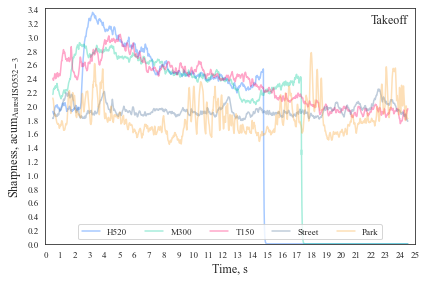

In [48]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet10'].iloc[13:, 0]
    sharpAISO3TimeVar2 = pd.DataFrame(workbookdata['Sheet10'].iloc[13:, 1:3].values,
                                     columns=workbookdata['Sheet10'].iloc[12, 1:3],
                                     index=workbookdata['Sheet10'].iloc[13:, 0])

    whichLR = np.argmax(sharpAISO3TimeVar2.mean(axis=0))
    sharpAISO3TimeVar = sharpAISO3TimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], sharpAISO3TimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 4, 0.2), xlim=[0, 25], ylim=[0, 3.425],
       xlabel="Time, s", ylabel=r"Sharpness, acum$_\text{Aures|ISO532-3}$")
ax.legend(labels=labels, ncol=len(labels), loc='lower center')
ax.text(x=22, y=3.2, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtASharptDepTakeoff.svg"), format='svg')
plt.show()

### Tonality

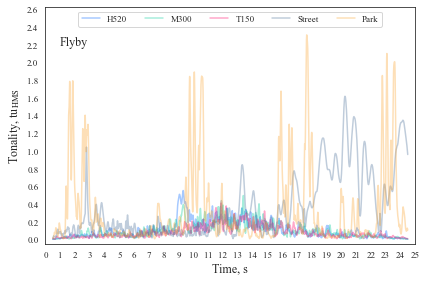

In [32]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet3'].iloc[13, 1:]
    # left channel
    specTonalityHMSL = pd.DataFrame(workbookdata['Sheet3'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet3'].iloc[13, 1:],
                                    index=workbookdata['Sheet3'].iloc[14:, 0])
    # right channel
    specTonalityHMSR = pd.DataFrame(workbookdata['Sheet4'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet4'].iloc[13, 1:],
                                    index=workbookdata['Sheet4'].iloc[14:, 0])
    # 2-channel time-varing tonality (max, not integration)
    tonalityHMSTimeVar2 = pd.concat([specTonalityHMSL.max(axis=0),
                                     specTonalityHMSR.max(axis=0)],
                                     axis=1)
    whichLR = np.argmax(tonalityHMSTimeVar2.mean(axis=0))
    tonalityHMSTimeVar = tonalityHMSTimeVar2.iloc[:, whichLR] 
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], tonalityHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 3, 0.2), xlim=[0, 25], ylim=[-0.05, 2.625],
       xlabel="Time, s", ylabel=r"Tonality, tu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=2.2, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtATonaltDepFlyby.svg"), format='svg')
plt.show()

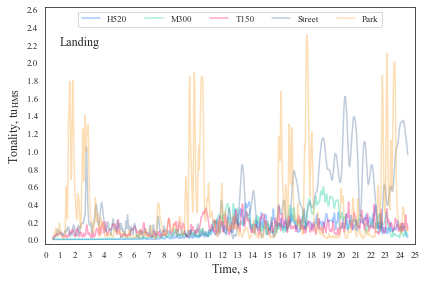

In [33]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet3'].iloc[13, 1:]
    # left channel
    specTonalityHMSL = pd.DataFrame(workbookdata['Sheet3'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet3'].iloc[13, 1:],
                                    index=workbookdata['Sheet3'].iloc[14:, 0])
    # right channel
    specTonalityHMSR = pd.DataFrame(workbookdata['Sheet4'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet4'].iloc[13, 1:],
                                    index=workbookdata['Sheet4'].iloc[14:, 0])
    # 2-channel time-varing tonality (max, not integration)
    tonalityHMSTimeVar2 = pd.concat([specTonalityHMSL.max(axis=0),
                                     specTonalityHMSR.max(axis=0)],
                                     axis=1)
    whichLR = np.argmax(tonalityHMSTimeVar2.mean(axis=0))
    tonalityHMSTimeVar = tonalityHMSTimeVar2.iloc[:, whichLR] 
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], tonalityHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 3, 0.2), xlim=[0, 25], ylim=[-0.05, 2.625],
       xlabel="Time, s", ylabel=r"Tonality, tu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=2.2, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtATonaltDepLanding.svg"), format='svg')
plt.show()

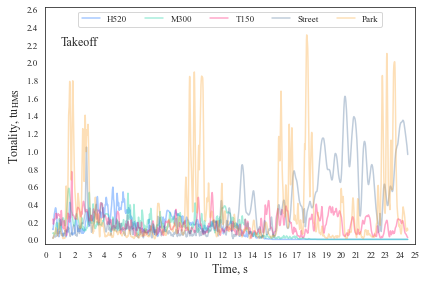

In [34]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet3'].iloc[13, 1:]
    # left channel
    specTonalityHMSL = pd.DataFrame(workbookdata['Sheet3'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet3'].iloc[13, 1:],
                                    index=workbookdata['Sheet3'].iloc[14:, 0])
    # right channel
    specTonalityHMSR = pd.DataFrame(workbookdata['Sheet4'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet4'].iloc[13, 1:],
                                    index=workbookdata['Sheet4'].iloc[14:, 0])
    # 2-channel time-varing tonality (max, not integration)
    tonalityHMSTimeVar2 = pd.concat([specTonalityHMSL.max(axis=0),
                                     specTonalityHMSR.max(axis=0)],
                                     axis=1)
    whichLR = np.argmax(tonalityHMSTimeVar2.mean(axis=0))
    tonalityHMSTimeVar = tonalityHMSTimeVar2.iloc[:, whichLR] 
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], tonalityHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 3, 0.2), xlim=[0, 25], ylim=[-0.05, 2.625],
       xlabel="Time, s", ylabel=r"Tonality, tu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=2.2, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtATonaltDepTakeoff.svg"), format='svg')
plt.show()

### Fluctuation strength

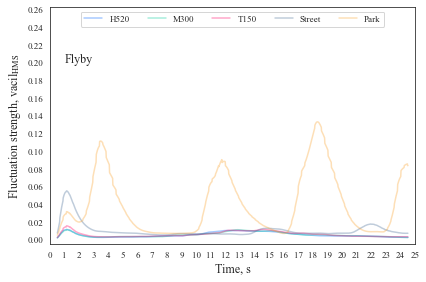

In [35]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet6'].iloc[13, 1:]
    # left channel
    specFluctStrHMSL = pd.DataFrame(workbookdata['Sheet6'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet6'].iloc[13, 1:],
                                    index=workbookdata['Sheet6'].iloc[14:, 0])
    # right channel
    specFluctStrHMSR = pd.DataFrame(workbookdata['Sheet7'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet7'].iloc[13, 1:],
                                    index=workbookdata['Sheet7'].iloc[14:, 0])
    # binaural specific fluctuation strength
    # (using ECMA-418-2:2022 Equation 112 for roughness)
    specFluctStrHMSBin = ((specFluctStrHMSL**2
                           + specFluctStrHMSR**2)/2).pow(1/2)
    # binaural time-dependent fluctuation strength
    # (using ECMA-418-2:2022 Equation 111 for roughness)
    fluctStrHMSTimeVar = specFluctStrHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], fluctStrHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.3, 0.02), xlim=[0, 25], ylim=[-0.005, 0.2625],
       xlabel="Time, s", ylabel=r"Fluctuation strength, vacil$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.2, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAFluctstDepFlyby.svg"), format='svg')
plt.show()

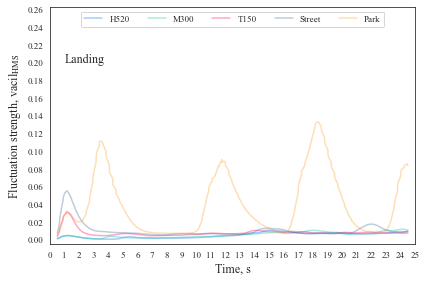

In [36]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet6'].iloc[13, 1:]
    # left channel
    specFluctStrHMSL = pd.DataFrame(workbookdata['Sheet6'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet6'].iloc[13, 1:],
                                    index=workbookdata['Sheet6'].iloc[14:, 0])
    # right channel
    specFluctStrHMSR = pd.DataFrame(workbookdata['Sheet7'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet7'].iloc[13, 1:],
                                    index=workbookdata['Sheet7'].iloc[14:, 0])
    # binaural specific fluctuation strength
    # (using ECMA-418-2:2022 Equation 112 for roughness)
    specFluctStrHMSBin = ((specFluctStrHMSL**2
                           + specFluctStrHMSR**2)/2).pow(1/2)
    # binaural time-dependent fluctuation strength
    # (using ECMA-418-2:2022 Equation 111 for roughness)
    fluctStrHMSTimeVar = specFluctStrHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], fluctStrHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.3, 0.02), xlim=[0, 25], ylim=[-0.005, 0.2625],
       xlabel="Time, s", ylabel=r"Fluctuation strength, vacil$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.2, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAFluctstDepLanding.svg"), format='svg')
plt.show()

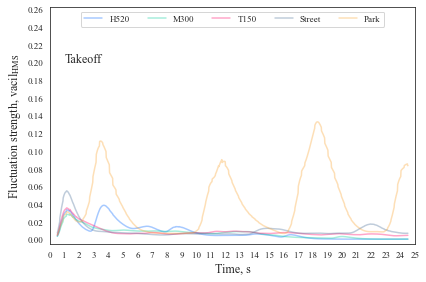

In [37]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet6'].iloc[13, 1:]
    # left channel
    specFluctStrHMSL = pd.DataFrame(workbookdata['Sheet6'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet6'].iloc[13, 1:],
                                    index=workbookdata['Sheet6'].iloc[14:, 0])
    # right channel
    specFluctStrHMSR = pd.DataFrame(workbookdata['Sheet7'].iloc[14:, 1:].values,
                                    columns=workbookdata['Sheet7'].iloc[13, 1:],
                                    index=workbookdata['Sheet7'].iloc[14:, 0])
    # binaural specific fluctuation strength
    # (using ECMA-418-2:2022 Equation 112 for roughness)
    specFluctStrHMSBin = ((specFluctStrHMSL**2
                           + specFluctStrHMSR**2)/2).pow(1/2)
    # binaural time-dependent fluctuation strength
    # (using ECMA-418-2:2022 Equation 111 for roughness)
    fluctStrHMSTimeVar = specFluctStrHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], fluctStrHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.3, 0.02), xlim=[0, 25], ylim=[-0.005, 0.2625],
       xlabel="Time, s", ylabel=r"Fluctuation strength, vacil$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.2, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAFluctstDepTakeoff.svg"), format='svg')
plt.show()

### Roughness

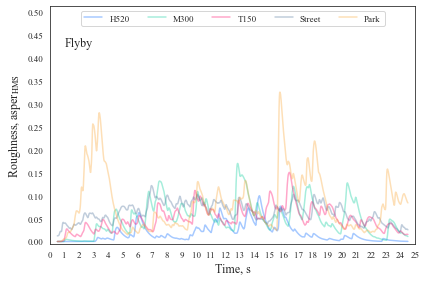

In [38]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet5'].iloc[13, 1:]
    # binaural specific roughness
    specRoughHMSBin = pd.DataFrame(workbookdata['Sheet5'].iloc[14:, 1:].values,
                                   columns=workbookdata['Sheet5'].iloc[13, 1:],
                                   index=workbookdata['Sheet5'].iloc[14:, 0])
    # binaural time-varying roughness
    roughHMSTimeVar = specRoughHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], roughHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.55, 0.05), xlim=[0, 25], ylim=[-0.005, 0.5125],
       xlabel="Time, s", ylabel=r"Roughness, asper$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.425, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtARoughtDepFlyby.svg"), format='svg')
plt.show()

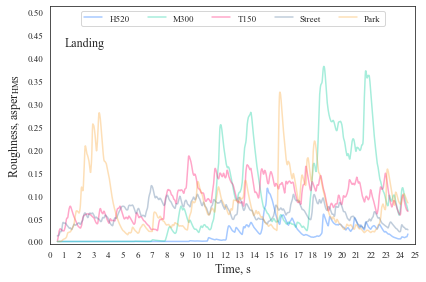

In [39]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet5'].iloc[13, 1:]
    # binaural specific roughness
    specRoughHMSBin = pd.DataFrame(workbookdata['Sheet5'].iloc[14:, 1:].values,
                                   columns=workbookdata['Sheet5'].iloc[13, 1:],
                                   index=workbookdata['Sheet5'].iloc[14:, 0])
    # binaural time-varying roughness
    roughHMSTimeVar = specRoughHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], roughHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.55, 0.05), xlim=[0, 25], ylim=[-0.005, 0.5125],
       xlabel="Time, s", ylabel=r"Roughness, asper$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.425, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtARoughtDepLanding.svg"), format='svg')
plt.show()

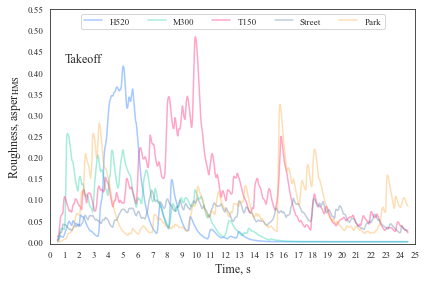

In [43]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet5'].iloc[13, 1:]
    # binaural specific roughness
    specRoughHMSBin = pd.DataFrame(workbookdata['Sheet5'].iloc[14:, 1:].values,
                                   columns=workbookdata['Sheet5'].iloc[13, 1:],
                                   index=workbookdata['Sheet5'].iloc[14:, 0])
    # binaural time-varying roughness
    roughHMSTimeVar = specRoughHMSBin.sum(axis=0)*0.5
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], roughHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 0.6, 0.05), xlim=[0, 25], ylim=[-0.005, 0.55],
       xlabel="Time, s", ylabel=r"Roughness, asper$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=1, y=0.425, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtARoughtDepTakeoff.svg"), format='svg')
plt.show()

### Impulsiveness

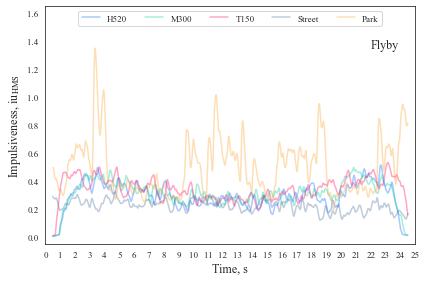

In [44]:
# flyby
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_F_1_SQM, M300_F_1_SQM, T150_F_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet12'].iloc[13:, 0]
    # 2-channel impulsiveness
    impulsiveHMSTimeVar2 = pd.DataFrame(workbookdata['Sheet12'].iloc[13:, 1:3].values,
                                       columns=workbookdata['Sheet12'].iloc[12, 1:3],
                                       index=workbookdata['Sheet12'].iloc[13:, 0])

    whichLR = np.argmax(impulsiveHMSTimeVar2.mean(axis=0))
    impulsiveHMSTimeVar = impulsiveHMSTimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], impulsiveHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 2, 0.2), xlim=[0, 25], ylim=[-0.05, 1.65],
       xlabel="Time, s", ylabel=r"Impulsiveness, iu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=22, y=1.35, s="Flyby", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAImpulstDepFlyby.svg"), format='svg')
plt.show()

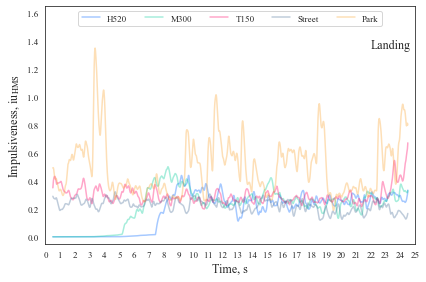

In [45]:
# landing
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_L_1_SQM, M300_L_1_SQM, T150_L_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet12'].iloc[13:, 0]
    # 2-channel impulsiveness
    impulsiveHMSTimeVar2 = pd.DataFrame(workbookdata['Sheet12'].iloc[13:, 1:3].values,
                                       columns=workbookdata['Sheet12'].iloc[12, 1:3],
                                       index=workbookdata['Sheet12'].iloc[13:, 0])

    whichLR = np.argmax(impulsiveHMSTimeVar2.mean(axis=0))
    impulsiveHMSTimeVar = impulsiveHMSTimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], impulsiveHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 2, 0.2), xlim=[0, 25], ylim=[-0.05, 1.65],
       xlabel="Time, s", ylabel=r"Impulsiveness, iu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=22, y=1.35, s="Landing", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAImpulstDepLanding.svg"), format='svg')
plt.show()

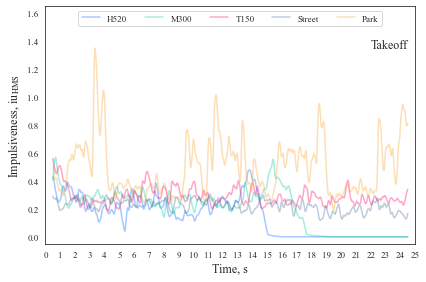

In [46]:
# takeoff
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_prop_cycle(cycler(color=mycolours))
labels = ["H520", "M300", "T150", "Street", "Park"]
for workbookdata in [H520_T_1_SQM, M300_T_1_SQM, T150_T_1_SQM, A1_SQM, A2_SQM]:
    t = workbookdata['Sheet12'].iloc[13:, 0]
    # 2-channel impulsiveness
    impulsiveHMSTimeVar2 = pd.DataFrame(workbookdata['Sheet12'].iloc[13:, 1:3].values,
                                       columns=workbookdata['Sheet12'].iloc[12, 1:3],
                                       index=workbookdata['Sheet12'].iloc[13:, 0])

    whichLR = np.argmax(impulsiveHMSTimeVar2.mean(axis=0))
    impulsiveHMSTimeVar = impulsiveHMSTimeVar2.iloc[:, whichLR]
    
    ax.plot(t[(t >= 0.5) & (t <= 24.5)], impulsiveHMSTimeVar[(t >= 0.5).values & (t <= 24.5).values], alpha=0.35)

ax.set(xticks=range(0, 26), yticks=np.arange(0, 2, 0.2), xlim=[0, 25], ylim=[-0.05, 1.65],
       xlabel="Time, s", ylabel=r"Impulsiveness, iu$_\text{HMS}$")
ax.legend(labels=labels, ncol=len(labels), loc='upper center')
ax.text(x=22, y=1.35, s="Takeoff", fontsize=12)
plt.savefig(os.path.join(outFigPath, "PtAImpulstDepTakeoff.svg"), format='svg')
plt.show()